In [1]:
from scipy import interpolate
import numpy as np

# tmp = coefficient * np.abs(result)
kx = ky = np.arange(0, 6., 0.1)
kx, ky = np.meshgrid(kx, ky)
l = kx.shape[0]
result = np.load('c.npy')
for i in range(l):
    for j in range(l):
        if i * i + j * j > 32 * 32:
            result[i, j] = 0.

kx = ky = np.arange(-5.9, 6.0, 0.1)
halflength = int((kx.shape[0] - 1) / 2)
for i in range(l):
    for j in range(l):
        if i * i + j * j > 32 * 32:
            result[i, j] = 0.

z = np.zeros((2 * l - 1, 2 * l - 1))
for i in range(halflength + 1):
    z[halflength + i, :halflength] = result[i, :0:-1]
    z[halflength + i, halflength:] = result[i, :]
for i in range(1, halflength + 1):
    z[halflength - i, :] = z[halflength + i, :]
    
S = np.sqrt(3.) / 2. * 3.28 * 3.28
coefficient = 1. / np.sqrt(float(S * S))
Ezz = interpolate.interp2d(kx, ky, -coefficient * z, kind='cubic')

In [2]:
import numpy as np
from numpy import linalg as LA
import matplotlib.lines as mlines 
import matplotlib.patches as mpatches
from matplotlib.patches import Circle, Wedge
from matplotlib.collections import PatchCollection
from sympy import *
import copy
import os
import cxx.SlatorKoster as ske    
from scipy import interpolate
import plotly as py
import plotly.graph_objs as go
from plotly import tools
import matplotlib.pyplot as plt
from scipy.constants import hbar
from inspect import currentframe, getframeinfo
from shapely.geometry import Point, Polygon, LineString

# Pauli matrices
sigma_x = np.array([[0., 1.], [1., 0.]])
sigma_y = np.array([[0., -1.j], [1.j, 0.]])
sigma_z = np.array([[1., 0.], [0., -1.]])
vf = 1. * 1e16 # angstrom/s

at = 3.32
ag = 2.46
# ag = a / 4 * 3
a1g = ag * np.array([1., 0.], dtype=float)
a2g = ag * np.array([-0.5, np.sqrt(3.) * 0.5], dtype=float)
b1g = 2. * np.pi / ag * np.array([1., 1. / np.sqrt(3.)], dtype=float)
b2g = 4. * np.pi / np.sqrt(3.) / ag * np.array([0., 1.], dtype=float)

def plotHexagon(ax, k, color, alpha):
	start = k
	for i in range(6):
		end = np.dot(R(-np.pi / 3.0), start)
		ax.add_line(
		    mlines.Line2D((start[0], end[0]),
		           (start[1], end[1]),
		           linewidth=1.5, color=color, alpha=alpha)
		)
		start = end

class TBLG():
    def __init__(self, angle0, angle):
        self.angle0 = angle0
        self.angle = angle
        self.a1gr = np.matmul(R(angle0), a1g)
        self.a2gr = np.matmul(R(angle0), a2g)
        self.tau = (self.a1gr + 2 * self.a2gr) / 3.
        self.b1gr = np.matmul(R(angle0), b1g)
        self.b2gr = np.matmul(R(angle0), b2g)
        self.gm1 = (np.eye(2) - R(self.angle)) @ self.b1gr
        self.gm2 = (np.eye(2) - R(self.angle)) @ self.b2gr
        self.K1 = -(2. * self.b1gr - self.b2gr) / 3.
        self.K2 = np.dot(R(self.angle), self.K1)
    
    def findInteractingK(self, k0, cutoffRadius):
        self.k0 = k0
        self.cutoffRadius = cutoffRadius
        
        # unit normal vector to gm1
        n1 = np.array([self.gm1[1], -self.gm1[0]]) / np.sqrt(np.dot(self.gm1, self.gm1))
        # unit normal vector to gm2
        n2 = np.array([self.gm2[1], -self.gm2[0]]) / np.sqrt(np.dot(self.gm2, self.gm2))
        
        range1 = np.sort([
            ( self.cutoffRadius - np.dot(k0, n2)) / np.dot(self.gm1, n2),
            (-self.cutoffRadius - np.dot(k0, n2)) / np.dot(self.gm1, n2)
        ])
        range2 = np.sort([
            ( self.cutoffRadius - np.dot(k0, n1)) / np.dot(self.gm2, n1),
            (-self.cutoffRadius - np.dot(k0, n1)) / np.dot(self.gm2, n1)
        ])
        
        count = 0
        self.kList = {}
        for i in range(math.ceil(range1[0]), math.floor(range1[1]) + 1):
            for j in range(math.ceil(range2[0]), math.floor(range2[1]) + 1):
                k = k0 + i * self.gm1 + j * self.gm2
                if(np.dot(k, k) <= self.cutoffRadius ** 2):
                    self.kList[(i, j)] = count
                    count += 1
    
    def findInteractingK2(self, k0, center, cutoffRadius):
        self.k0 = k0
        self.center = center
        self.cutoffRadius = cutoffRadius
        
        # unit normal vector to gm1
        n1 = np.array([self.gm1[1], -self.gm1[0]]) / np.sqrt(np.dot(self.gm1, self.gm1))
        # unit normal vector to gm2
        n2 = np.array([self.gm2[1], -self.gm2[0]]) / np.sqrt(np.dot(self.gm2, self.gm2))
        
        range1 = np.sort([
            ( cutoffRadius - np.dot(k0 - center, n2)) / np.dot(self.gm1, n2),
            (-cutoffRadius - np.dot(k0 - center, n2)) / np.dot(self.gm1, n2)
        ])
        range2 = np.sort([
            ( cutoffRadius - np.dot(k0 - center, n1)) / np.dot(self.gm2, n1),
            (-cutoffRadius - np.dot(k0 - center, n1)) / np.dot(self.gm2, n1)
        ])
        
        count = 0
        self.kList = {}
        for i in range(int(np.ceil(range1[0])), int(np.floor(range1[1])) + 1):
            for j in range(int(np.ceil(range2[0])), int(np.floor(range2[1])) + 1):
                k = k0 + i * self.gm1 + j * self.gm2 - center
                if(np.dot(k, k) <= cutoffRadius ** 2):
                    self.kList[(i, j)] = count
                    count += 1
    
    def plot(self):
        fig = plt.figure(figsize=(8,8))
        ax = fig.add_subplot(111, aspect='equal')
        print(len(self.kList.keys()))
        for i, j in self.kList.keys():
            k = self.k0 + i * self.gm1 + j * self.gm2
            ax.add_patch(
               Circle((k[0],k[1]), 0.008, fc='black')
            )
        ax.add_patch(
            Wedge((0., 0.), self.cutoffRadius, 0, 360, width=0.004)
        )
        plotHexagon(ax, self.K2, 'red', 0.8)
        plotHexagon(ax, self.K1, 'blue', 0.8)
        # plt.axhline(y=0)
        plt.xlim((-self.cutoffRadius - 0.5, self.cutoffRadius + 0.5))
        plt.ylim((-self.cutoffRadius - 0.5, self.cutoffRadius + 0.5))
        fig.show()
        
    def plot2(self):
        fig = plt.figure(figsize=(8,8))
        ax = fig.add_subplot(111, aspect='equal')
        print(len(self.kList.keys()))
        for i, j in self.kList.keys():
            k = self.k0 + i * self.gm1 + j * self.gm2
            ax.add_patch(
               mpatches.Circle((k[0],k[1]), 0.008, fc='black')
            )
        ax.add_patch(
            mpatches.Wedge((self.center[0], self.center[1]), self.cutoffRadius, 0, 360, width=0.004)
        )
        plotHexagon(ax, self.K1, 'red', 0.8)
        plotHexagon(ax, self.K2, 'blue', 0.8)
        limit = float(np.sqrt(np.dot(self.K1,self.K1)) + self.cutoffRadius + 0.5)
        plt.xlim((-limit, limit))
        plt.ylim((-limit, limit))
        fig.show()
        
    def getHg(self, k):
        """
        generate Hamiltonian matrix for graphene with spin

        Parameter
        ---------
        k : float 1d array(l = 2)
            input k vector

        Return
        ------
        H : complex 2 by 2 array
            column/row arrangement:
                |A>, |B>
        """

        # hopping integral
        t = 2.7 # eV

        H = np.zeros((4, 4), dtype=complex)
        aa = ag / np.sqrt(3.)
        f = -t * np.exp(-1.j * k[1] * aa) * (1 + 2. * np.exp(1.5j * k[1] * aa) * np.cos(np.sqrt(3) * .5 * k[0] * aa))
        H[0, 1] = H[2, 3] = f
        H[1, 0] = H[3, 2] = np.conj(f)
        
        return H
    
    def getHamiltonian(self, k0):
        center = (self.K1 + self.K2) / 2.
        cutoffRadius = 1.
        nk = len(self.kList.keys())
        dim = 4 # 2 sublattice * 2 spin
        hamiltonian = np.zeros((2 * dim * nk, 2 * dim * nk), dtype=complex)

        # layer 1 intralayer
        for key, index in self.kList.items():
            k = k0 + key[0] * self.gm1 + key[1] * self.gm2
            hamiltonian[dim * index : dim * index + dim, dim * index : dim * index + dim] = \
            self.getHg(R(-self.angle0) @ k)
            # scipy.constants.hbar / scipy.constants.e * vf * (tmp[0] * sigma_x + tmp[1] * sigma_y)

        # layer 2 intralayer
        for key, index in self.kList.items():
            k = k0 + key[0] * self.gm1 + key[1] * self.gm2
            hamiltonian[dim * (nk + index) : dim * (nk + index + 1), dim * (nk + index) : dim * (nk + index + 1)] = \
            self.getHg(R(-self.angle0 - self.angle) @ k)
            # scipy.constants.hbar / scipy.constants.e * vf * (tmp[0] * sigma_x + tmp[1] * sigma_y)
                
        # interlayer
        u = 0.103 #eV
        omega = np.exp(2.j * np.pi / 3.)
        neighbor = [(1, 0), (0, 1), (1, -1), (-1, 0), (0, -1), (-1, 1)]
        for key, index1 in self.kList.items():
            k = k0 + key[0] * self.gm1 + key[1] * self.gm2
            hamiltonian[dim * (nk + index1) : dim * (nk + index1 + 1), dim * index1 : dim * index1 + dim] += \
            np.kron(np.eye(2), np.ones((2, 2))) * Ezz(k[0], k[1])

            for ki, kj in neighbor:
                if (key[0] + ki, key[1] + kj) in self.kList:
                    index2 = self.kList[(key[0] + ki, key[1] + kj)]
                    kprime = k + ki * self.b1gr + kj * self.b2gr
                    hamiltonian[dim * (nk + index2) : dim * (nk + index2 + 1), dim * index1 : dim * index1 + dim] += \
                    Ezz(kprime[0], kprime[1]) *\
                    np.kron(
                        np.eye(2),
                        np.array(
                            [[1,  np.exp(1.j * np.dot(self.tau, ki * self.b1gr + kj * self.b2gr))], 
                             [np.exp(-1.j * np.dot(self.tau, ki * self.b1gr + kj * self.b2gr)), 1]]
                        )
                    )
                
        return hamiltonian
    
    @property 
    def dim(self):
        return len(self.kList)

In [3]:
def R(angle):
    return np.array([[np.cos(angle), -np.sin(angle)],
                     [np.sin(angle),  np.cos(angle)]], dtype= float)

at = 3.32
ag = 2.46
lambda_M = 0.2874
lambda_X = 0.2470
d_cs = 1.94 # angstrom 
d_moc = 2.2 # angstrom https://en.wikipedia.org/wiki/Tungsten_carbide
r_0 = -d_cs / np.log(0.2)
r_0m = -d_moc / np.log(0.2)
d = 3.42 # angstrom
dm = d + 3.35 / 2. # angstrom

a1 = at * np.array([1., 0.], dtype=float)
a2 = at * np.array([-0.5, np.sqrt(3.) * 0.5], dtype=float)
delta = np.zeros((9, 2), dtype=float)
delta[0, :] = a1
delta[1, :] = a1 + a2
delta[2, :] = a2
delta[3, :] = -(2. * a1 + a2) / 3.
delta[4, :] =  (a1 + 2. * a2) / 3.
delta[5, :] = (a1 - a2) / 3.
delta[6, :] = -2. * (a1 + 2. * a2) / 3.
delta[7, :] =  2. * (2. * a1 + a2) / 3.
delta[8, :] = 2. * (a2 - a1) / 3. 

epsilon = np.zeros(11)
t = np.zeros((6, 11, 11))

epsilon[0]   = epsilon[1 ] =    1.0349
epsilon[2]   =                 -0.9573
epsilon[3]   = epsilon[4 ] =   -1.3937
epsilon[5]   =                 -0.1667
epsilon[6]   = epsilon[7 ] =    0.0984
epsilon[8]   =                 -3.3642
epsilon[9]   = epsilon[10] =   -2.1820
t[0, 0 , 0 ] =                 -0.1395
t[0, 1 , 1 ] =                  0.0129
t[0, 2 , 2 ] =                 -0.2171
t[0, 3 , 3 ] =                  0.9763
t[0, 4 , 4 ] =                 -0.1985
t[0, 5 , 5 ] =                 -0.3330
t[0, 6 , 6 ] =                  0.3190
t[0, 7 , 7 ] =                 -0.5837
t[0, 8 , 8 ] =                 -0.2399
t[0, 9 , 9 ] =                  1.0470
t[0, 10, 10] =                  0.0029
t[0, 2 , 4 ] =                 -0.0912
t[0, 5 , 7 ] =                  0.4233
t[0, 8 , 10] =                 -0.0377
t[0, 0 , 1 ] =                 -0.2321
t[0, 2 , 3 ] =                 -0.0797
t[0, 3 , 4 ] =                 -0.0920
t[0, 5 , 6 ] =                 -0.1250
t[0, 6 , 7 ] =                 -0.2456
t[0, 8 , 9 ] =                  0.1857
t[0, 9 , 10] =                 -0.1027
t[4, 3 , 0 ] =                 -0.7744
t[4, 2 , 1 ] =                 -1.4014
t[4, 4 , 1 ] =                  2.0858
t[4, 8 , 5 ] =                 -0.8998
t[4, 10, 5 ] =                 -0.9044
t[4, 9 , 6 ] =                  1.4030
t[4, 8 , 7 ] =                 -0.8548
t[4, 10, 7 ] =                  0.5711
t[5, 8 , 5 ] =                 -0.0676
t[5, 10, 5 ] =                 -0.1608
t[5, 8 , 7 ] =                 -0.2618
t[5, 10, 7 ] =                 -0.2424

for (a, b) in [(0, 1), (3, 4), (6, 7), (9, 10)]:
    t[1, a, a] = 0.25 * t[0, a, a] + 0.75 * t[0, b, b]
    t[1, b, b] = 0.75 * t[0, a, a] + 0.25 * t[0, b, b]
    t[1, a, b] =  np.sqrt(3.0) * 0.25 * (t[0, a, a] - t[0, b, b]) - t[0, a, b]
    t[2, a, b] = -np.sqrt(3.0) * 0.25 * (t[0, a, a] - t[0, b, b]) - t[0, a, b]
    
for (a, b, c) in [(3, 4, 2), (6, 7, 5), (9, 10, 8)]:
    t[1, c, c] = t[0, c, c]
    t[1, c, b] =  np.sqrt(3.0) * 0.5 * t[0, c, a] - 0.5 * t[0, c, b]
    t[2, c, b] = -np.sqrt(3.0) * 0.5 * t[0, c, a] - 0.5 * t[0, c, b]
    t[1, c, a] =  0.5 * t[0, c, a] + np.sqrt(3.0) * 0.5 * t[0, c, b]
    t[2, c, a] =  0.5 * t[0, c, a] - np.sqrt(3.0) * 0.5 * t[0, c, b]
    
for (a, b, ap, bp, cp) in [(0, 1, 3, 4, 2), (6, 7, 9, 10, 8)]:
    t[3, ap, a] = 0.25 * t[4, ap, a] + 0.75 * t[4, bp, b]
    t[3, bp, b] = 0.75 * t[4, ap, a] + 0.25 * t[4, bp, b]
    t[3, bp, a] = t[3, ap, b] \
                = -np.sqrt(3.0) * 0.25 * (t[4, ap, a] -t[4, bp, b])
    t[3, cp, a] = -np.sqrt(3.0) * 0.5 * t[4, cp, b]
    t[3, cp, b] = -0.5 * t[4, cp, b]

t[3, 8, 5] = t[4, 8, 5]
t[3, 9, 5] = -np.sqrt(3.0) * 0.5 * t[4, 10, 5]
t[3, 10, 5] = -0.5 * t[4, 10, 5]

screenTM = 1.

def debug_print(*arg):
    frameinfo = currentframe()
    print(frameinfo.f_back.f_lineno, ":", *arg)

def genH(k):
    H = np.zeros((11, 11), dtype=complex)
    for i in range(11):
        H[i, i] = epsilon[i] + \
                  2. * t[0, i, i] * np.cos(np.dot(k, delta[0])) + \
                  2. * t[1, i, i] * (np.cos(np.dot(k, delta[1])) + np.cos(np.dot(k, delta[2])))
    
    for (i, j) in [(2, 4), (5, 7), (8, 10)]:
        H[j, i] = np.conj(
                  2. * t[0, i, j] * np.cos(np.dot(k, delta[0])) + \
                  t[1, i, j] * (np.exp(-1.j * np.dot(k, delta[1])) + np.exp(-1.j * np.dot(k, delta[2]))) + \
                  t[2, i, j] * (np.exp( 1.j * np.dot(k, delta[1])) + np.exp( 1.j * np.dot(k, delta[2]))) )
                
    for (i, j) in [(0, 1), (2, 3), (3, 4), (5, 6), (6, 7), (8, 9), (9,10)]:
        H[j, i] = np.conj(
                  -2.j * t[0, i, j] * np.sin(np.dot(k, delta[0])) + \
                  t[1, i, j] * ( np.exp(-1.j * np.dot(k, delta[1])) - np.exp(-1.j * np.dot(k, delta[2]))) + \
                  t[2, i, j] * (-np.exp( 1.j * np.dot(k, delta[1])) + np.exp( 1.j * np.dot(k, delta[2]))) )
                
    for (i, j) in [(2, 0), (4, 0), (3, 1), (9, 5), (8, 6), (10, 6), (9, 7)]:
        H[i, j] = t[3, i, j] * (np.exp( 1.j * np.dot(k, delta[3])) - np.exp( 1.j * np.dot(k, delta[5])))
        
    for (i, j) in [(3, 0), (2, 1), (4, 1), (8, 5), (10, 5), (9, 6), (8, 7), (10, 7)]:
        H[i, j] = t[3, i, j] * (np.exp( 1.j * np.dot(k, delta[3])) + np.exp( 1.j * np.dot(k, delta[5]))) + \
        t[4, i, j] * np.exp(1.j * np.dot(k, delta[4]))
        
    # NN X-M correction
    H[8, 5] += t[5, 8, 5] * (np.exp(1.j * np.dot(k, delta[6])) + \
                             np.exp(1.j * np.dot(k, delta[7])) + \
                             np.exp(1.j * np.dot(k, delta[8])))
    
    H[10, 5] += t[5, 10, 5] * (np.exp(1.j * np.dot(k, delta[6])) - \
                               np.exp(1.j * np.dot(k, delta[7])) * .5 - \
                               np.exp(1.j * np.dot(k, delta[8])) * .5)
    

    H[9, 5] += np.sqrt(3.) * .5 * t[5, 10, 5] * \
               (-np.exp(1.j * np.dot(k, delta[7])) + np.exp(1.j * np.dot(k, delta[8])))
    
    H[8, 7] += t[5, 8, 7] * (np.exp(1.j * np.dot(k, delta[6])) - \
                             np.exp(1.j * np.dot(k, delta[7])) * .5 - \
                             np.exp(1.j * np.dot(k, delta[8])) * .5)
    
    H[8, 6] += np.sqrt(3.) * .5 * t[5, 8, 7] * \
               (-np.exp(1.j * np.dot(k, delta[7])) + np.exp(1.j * np.dot(k, delta[8])))
        
    H[9, 6] += .75 * t[5, 10, 7] * (np.exp(1.j * np.dot(k, delta[7])) + np.exp(1.j * np.dot(k, delta[8])))
    
    H[10, 6] += np.sqrt(3.) * .25 * t[5, 10, 7] * \
                (np.exp(1.j * np.dot(k, delta[7])) - np.exp(1.j * np.dot(k, delta[8])))
        
    H[9, 7] += np.sqrt(3.) * .25 * t[5, 10, 7] * \
               (np.exp(1.j * np.dot(k, delta[7])) - np.exp(1.j * np.dot(k, delta[8])))
        
    H[10, 7] += t[5, 10, 7] * (np.exp(1.j * np.dot(k, delta[6])) + \
                               np.exp(1.j * np.dot(k, delta[7])) * .25 + \
                               np.exp(1.j * np.dot(k, delta[8])) * .25)
    
    return H

class basis:
    def __init__(self, quantumNumbers):
        self.__length = len(quantumNumbers)
        self.__quantumNumbers = quantumNumbers
        
    def getLength(self):
        return self.__length
    
    def getQuantumNumber(self, i):
        return self.__quantumNumbers[i]
    
    def setQuantumNumber(self, i, num):
        self.__quantumNumbers[i] = num
        
    def toString(self):
        string = '|' + str(self.__quantumNumbers[0])
        for i in self.__quantumNumbers[1:]:
            string += ', ' + str(i)
        string += '>'
        return string
    
    def __eq__(self, anotherBasis):
        if (self.__length != anotherBasis.__length):
            return False
        
        for i in range(self.__length):
            if self.__quantumNumbers[i] != anotherBasis.__quantumNumbers[i]:
                return False
            
        return True
    
    def __mul__(self, coefficient):
        return state(coefficient, basis(self.__quantumNumbers))
        
    def __rmul__(self, coefficient):
        return state(coefficient, basis(self.__quantumNumbers))
    
class state:
    def __init__(self, coefficient, basis):
        self.terms = [[coefficient, basis]]
        
    def display(self):
        if len(self.terms) == 0:
            print('None')
        else:
            tmp = str(self.terms[0][0]) + self.terms[0][1].toString()
            for i in range(1, len(self.terms)):
                tmp += ' + ' + str(self.terms[i][0]) + self.terms[i][1].toString()
            print(tmp)
        
    def __add__(self, otherState):
        result = copy.deepcopy(self)
        for i in otherState.terms:
            found = False
            for j in result.terms:
                if i[1] == j[1]:
                    found = True
                    j[0] += i[0]
                    if not isinstance(j[0], Basic) and (abs(j[0]) < 10e-8):
                        result.terms.remove(j)
                    break
            if not found:
                result.terms.append(i)
        return result
    
    def __sub__(self, otherState):
        result = copy.deepcopy(self)
        for i in otherState.terms:
            found = False
            for j in result.terms:
                if i[1] == j[1]:
                    found = True
                    j[0] -= i[0]
                    if not isinstance(j[0], Basic) and (abs(j[0]) < 10e-8):
                        result.terms.remove(j)
                    break
            if not found:
                tmp = copy.deepcopy(i)
                tmp[0] = -tmp[0]
                result.terms.append(tmp)
        return result
    
    def __mul__(self, coefficient):
        result = copy.deepcopy(self)
        if not isinstance(coefficient, Basic) and (abs(coefficient) < 10e-8):
            result.terms = []
        else:
            for i in result.terms:
                i[0] *= coefficient
        return result
    
    def __rmul__(self, coefficient):
        result = copy.deepcopy(self)
        if not isinstance(coefficient, Basic) and (abs(coefficient) < 10e-8):
            result.terms = []
        else:
            for i in result.terms:
                i[0] *= coefficient
        return result
            
def Sz(state):
    result = copy.deepcopy(state)
    for i in range(len(result.terms)):
        if result.terms[i][1].getQuantumNumber(3) == 'up':
            result.terms[i][0] *= .5
        else:
            result.terms[i][0] *= -.5
    return result
        
def Splus(state):
    result = copy.deepcopy(state)
    stateToBeDeleted = []
    for i in range(len(result.terms)):
        if result.terms[i][1].getQuantumNumber(3) == 'up':
            stateToBeDeleted.append(i)
        else:
            result.terms[i][1].setQuantumNumber(3, 'up')
            
    for i in sorted(stateToBeDeleted, reverse=True):
        del result.terms[i]
        
    return result
                    
def Sminus(state):
    result = copy.deepcopy(state)
    stateToBeDeleted = []
    for i in range(len(result.terms)):
        if result.terms[i][1].getQuantumNumber(3) == 'down':
            stateToBeDeleted.append(i)
        else:
            result.terms[i][1].setQuantumNumber(3, 'down')
            
    for i in sorted(stateToBeDeleted, reverse=True):
        del result.terms[i]
        
    return result

def Lz(state, atomType):
    result = copy.deepcopy(state)
    stateToBeDeleted = []
    for i in range(len(result.terms)):
        if result.terms[i][1].getQuantumNumber(0) != atomType:
            stateToBeDeleted.append(i)
        else:
            result.terms[i][0] *= state.terms[i][1].getQuantumNumber(2)
            if result.terms[i][0] == 0:
                stateToBeDeleted.append(i)
            
    for i in sorted(stateToBeDeleted, reverse=True):
        del result.terms[i]
        
    return result

def Lplus(state, atomType):
    result = copy.deepcopy(state)
    stateToBeDeleted = []
    for i in range(len(result.terms)):
        l = result.terms[i][1].getQuantumNumber(1)
        m = result.terms[i][1].getQuantumNumber(2)
        if result.terms[i][1].getQuantumNumber(0) != atomType:
            stateToBeDeleted.append(i)
        elif m == l:
            stateToBeDeleted.append(i)
        else:
            result.terms[i][1].setQuantumNumber(2, m + 1)
            result.terms[i][0] *= sqrt(l * (l + 1) - m * (m + 1))
            if result.terms[i][0] == 0:
                stateToBeDeleted.append(i)
            
    for i in sorted(stateToBeDeleted, reverse=True):
        del result.terms[i]
        
    return result

def Lminus(state, atomType):
    result = copy.deepcopy(state)
    stateToBeDeleted = []
    for i in range(len(result.terms)):
        l = result.terms[i][1].getQuantumNumber(1)
        m = result.terms[i][1].getQuantumNumber(2)
        if result.terms[i][1].getQuantumNumber(0) != atomType:
            stateToBeDeleted.append(i)
        elif m == -l:
            stateToBeDeleted.append(i)
        else:
            result.terms[i][1].setQuantumNumber(2, m - 1)
            result.terms[i][0] *= sqrt(l * (l + 1) - m * (m - 1))
            if result.terms[i][0] == 0:
                stateToBeDeleted.append(i)
            
    for i in sorted(stateToBeDeleted, reverse=True):
        del result.terms[i]
        
    return result

def LdotS(state, atomType):
    return Lplus(Sminus(state), atomType) * .5 + \
           Lminus(Splus(state), atomType) * .5 + \
           Lz(Sz(state), atomType)

def innerProduct(state1, state2):
    result = 0
    if (len(state1.terms) == 0) or (len(state2.terms) == 0):
        return 0
    
    for term1 in state1.terms:
        for term2 in state2.terms:
            if term1[1] == term2[1]:
                result += conjugate(term1[0]) * term2[0]
                break
    return result

# SOC strength
lambda_Mo = symbols('lambda_Mo')  #0.0836
lambda_S  = symbols('lambda_S')   #0.0556

psi = [1 * basis(['M', 2, 0, 'up']),                                                                # 0   
       (-1j / sqrt(2)) * basis(['M', 2, 2, 'up']) + (1j / sqrt(2)) * basis(['M', 2, -2, 'up']),     # 1     
       (1 / sqrt(2)) * basis(['M', 2, 2, 'up']) + (1 / sqrt(2)) * basis(['M', 2, -2, 'up']),        # 2  
       (-1 / sqrt(2)) * basis(['M', 2, 1, 'up']) + (1 / sqrt(2)) * basis(['M', 2, -1, 'up']),       # 3       
       (1j / sqrt(2)) * basis(['M', 2, 1, 'up']) + (1j / sqrt(2)) * basis(['M', 2, -1, 'up']),      # 4    
       (-1 / sqrt(2)) * basis(['A', 1, 1, 'up']) + (1 / sqrt(2)) * basis(['A', 1, -1, 'up']),       # 5     
       (1j / sqrt(2)) * basis(['A', 1, 1, 'up']) + (1j / sqrt(2)) * basis(['A', 1, -1, 'up']),      # 6    
       1 * basis(['A', 1, 0, 'up']),                                                                # 7     
       (-1 / sqrt(2)) * basis(['B', 1, 1, 'up']) + (1 / sqrt(2)) * basis(['B', 1, -1, 'up']),       # 8        
       (1j / sqrt(2)) * basis(['B', 1, 1, 'up']) + (1j / sqrt(2)) * basis(['B', 1, -1, 'up']),      # 9    
       1 * basis(['B', 1, 0, 'up']),                                                                # 10     
       1 * basis(['M', 2, 0, 'down']),                                                              # 11    
       (-1j / sqrt(2)) * basis(['M', 2, 2, 'down']) + (1j / sqrt(2)) * basis(['M', 2, -2, 'down']), # 12       
       (1 / sqrt(2)) * basis(['M', 2, 2, 'down']) + (1 / sqrt(2)) * basis(['M', 2, -2, 'down']),    # 13     
       (-1 / sqrt(2)) * basis(['M', 2, 1, 'down']) + (1 / sqrt(2)) * basis(['M', 2, -1, 'down']),   # 14        
       (1j / sqrt(2)) * basis(['M', 2, 1, 'down']) + (1j / sqrt(2)) * basis(['M', 2, -1, 'down']),  # 15           
       (-1 / sqrt(2)) * basis(['A', 1, 1, 'down']) + (1 / sqrt(2)) * basis(['A', 1, -1, 'down']),   # 16          
       (1j / sqrt(2)) * basis(['A', 1, 1, 'down']) + (1j / sqrt(2)) * basis(['A', 1, -1, 'down']),  # 17        
       1 * basis(['A', 1, 0, 'down']),                                                              # 18    
       (-1 / sqrt(2)) * basis(['B', 1, 1, 'down']) + (1 / sqrt(2)) * basis(['B', 1, -1, 'down']),   # 19      
       (1j / sqrt(2)) * basis(['B', 1, 1, 'down']) + (1j / sqrt(2)) * basis(['B', 1, -1, 'down']),  # 20         
       1 * basis(['B', 1, 0, 'down'])                                                               # 21    
      ]

phi = [psi[3],                                  # 0
       psi[4],                                  # 1
       (1 / sqrt(2) * (psi[7] + psi[10])),      # 2
       (1 / sqrt(2) * (psi[5] - psi[8])),       # 3
       (1 / sqrt(2) * (psi[6] - psi[9])),       # 4
       psi[0],                                  # 5
       psi[1],                                  # 6
       psi[2],                                  # 7
       (1 / sqrt(2) * (psi[7] - psi[10])),      # 8
       (1 / sqrt(2) * (psi[5] + psi[8])),       # 9
       (1 / sqrt(2) * (psi[6] + psi[9])),       # 10
       psi[14],                                 # 11
       psi[15],                                 # 12
       (1 / sqrt(2) * (psi[18] + psi[21])),     # 13
       (1 / sqrt(2) * (psi[16] - psi[19])),     # 14
       (1 / sqrt(2) * (psi[17] - psi[20])),     # 15
       psi[11],                                 # 16
       psi[12],                                 # 17
       psi[13],                                 # 18
       (1 / sqrt(2) * (psi[18] - psi[21])),     # 19
       (1 / sqrt(2) * (psi[16] + psi[19])),     # 20
       (1 / sqrt(2) * (psi[17] + psi[20]))      # 21
      ]

H_so = zeros(22, 22)
for i in range(22):
    for j in range(22):
        H_so[i, j] = innerProduct(phi[i], lambda_Mo * LdotS(phi[j], 'M') + \
                                          lambda_S  * LdotS(phi[j], 'A') + \
                                          lambda_S  * LdotS(phi[j], 'B'))
        
H_so = H_so.evalf(subs={lambda_Mo: lambda_M, lambda_S: lambda_X})
H_so = np.array(H_so).astype(np.complex64)

eta_ppsigma = 2.22
eta_pppi = -0.63

r_pC = 6.59 # angstrom 
r_dMo = 1.285 # angstrom 
eta_pdsigma = - 3. * np.sqrt(15.) / 2. / np.pi
eta_pdpi = 3. * np.sqrt(5.) / 2. / np.pi

V_pppi0 = 7.62 * eta_pppi / d_cs / d_cs
V_ppsigma0 = 7.62 * eta_ppsigma / d_cs / d_cs

V_pdpi0 = 7.62 * eta_pdpi * np.sqrt(r_pC * r_dMo ** 3) / d_moc ** 4
V_pdsigma0 = 7.62 * eta_pdsigma * np.sqrt(r_pC * r_dMo ** 3) / d_moc ** 4

def R(angle):
    return np.array([[np.cos(angle), -np.sin(angle)],
                     [np.sin(angle),  np.cos(angle)]], dtype= float)

def genHg(k, ag):
    """
    generate Hamiltonian matrix of AB-stacking bilayer graphene with spin
    
    Parameter
    ---------
    k : float 1d array(l = 2)
        input k vector
        
    Return
    ------
    H : complex 8 by 8 array
        column/row arrangement:
            |A1, up>, |B1, up>, |A1, down>, |B1, down>
            |A2, up>, |B2, up>, |A2, down>, |B2, down>
    """
    
    # K = np.array([0., 4. * np.pi / 3.])
    # k = k - K
    
    aa = ag / np.sqrt(3.)
    f = np.exp(-1.j * k[1] * aa) * (1 + 2. * np.exp(1.5j * k[1] * aa) * np.cos(np.sqrt(3) * .5 * k[0] * aa))
    H = np.zeros((8, 8), dtype=complex)
    gamma0 = 3.16 # eV
    gamma1 = 0.381 # eV
    gamma3 = 0.38 # eV
    gamma4 = 0.14 # eV
    hbar_v = np.sqrt(3.) * ag * gamma0 / 2. 
    
    H[0, 1] = H[2, 3] = H[4, 5] = H[6, 7] = -gamma0 * f

    H[1, 4] = H[3, 6] = gamma1
    H[0, 4] = H[2, 6] = H[1, 5] = H[3, 7] = gamma4 * f
    H[0, 5] = H[2, 7] = -gamma3 * np.conj(f)
    
    H = H + H.conj().T
    
    return H

class EffectiveHamiltonian():
    """
    effective Hamiltonian of graphene k point kg which hops to some km of MoS2 and then hop back to itself
    """
    
    def __init__(self, latticeConstant, rotationAngle, radius):
        """
        Parameter
        ---------
        latticeConstant : float 1d array(l = 2)
            [MoS2, C]
        rotationAngle : float
            rotation angle between graphene and MoS2
        radius : float
            cutoff circle radius
        """
        self.__rotationAngle = rotationAngle
        self.__radius = radius
        self.__am = latticeConstant[0]
        self.__ag = latticeConstant[1]
        
        a1g = self.__ag * np.array([1., 0.], dtype=float)
        a2g = self.__ag * np.array([-0.5, np.sqrt(3.) * 0.5], dtype=float)
        b1g = 2. * np.pi / self.__ag * np.array([1., 1. / np.sqrt(3.)], dtype=float)
        b2g = 4. * np.pi / np.sqrt(3.) / self.__ag * np.array([0., 1.], dtype=float)
        # K_+
        Kpg = (2. * b1g - b2g) / 3.
        Kmg = b1g / 2.
        
        a1 = self.__am * np.array([1., 0.], dtype=float)
        a2 = self.__am * np.array([-0.5, np.sqrt(3.) * 0.5], dtype=float)
        b1 = 2. * np.pi / self.__am * np.array([1., 1. / np.sqrt(3.)], dtype=float)
        b2 = 4. * np.pi / np.sqrt(3.) / self.__am * np.array([0., 1.], dtype=float)

        self.__b1m = b1
        self.__b2m = b2
        self.Kpm = (2 * b1 - b2) / 3.
        
        a1gr = np.matmul(R(rotationAngle), a1g)
        a2gr = np.matmul(R(rotationAngle), a2g)
        b1gr = np.matmul(R(rotationAngle), b1g)
        b2gr = np.matmul(R(rotationAngle), b2g)
        Kpgr = np.matmul(R(rotationAngle), Kpg)
        Kmgr = np.matmul(R(rotationAngle), Kmg)
        
        self.__b1g = b1gr
        self.__b2g = b2gr
        self.__Kpg = Kpgr
        self.__Kmg = Kmgr
        
        self.__kmDict = {}
        self.__kg = np.zeros(2, dtype=float)
        
        self.__onsite = 1.3 # eV
        
        brillouinZone1stMoS2 = []
        brillouinZone1stMoS2.append(tuple(self.Kpm))
        brillouinZone1stMoS2.append(tuple(np.dot(R( 60. / 180. * np.pi), self.Kpm)))
        brillouinZone1stMoS2.append(tuple(np.dot(R(120. / 180. * np.pi), self.Kpm)))
        brillouinZone1stMoS2.append(tuple(np.dot(R(180. / 180. * np.pi), self.Kpm)))
        brillouinZone1stMoS2.append(tuple(np.dot(R(240. / 180. * np.pi), self.Kpm)))
        brillouinZone1stMoS2.append(tuple(np.dot(R(300. / 180. * np.pi), self.Kpm)))
        self.__brillouinZone1stBoundaryMoS2 = LineString(brillouinZone1stMoS2[:4])
        self.__brillouinZone1stMoS2 = Polygon(brillouinZone1stMoS2)
        
        self.__tau_Mo = np.array([0., 0.], dtype=float)
        self.__tau_S  = np.array([0., 0.], dtype=float)#(2. * a1 + a2) / 3.
        self.__tau_A  = (a1gr + 2. * a2gr) / 3.
        self.__tau_B  = np.array([0., 0.], dtype=float)
        
        self.__dSign = [-1, -1, 1, 1, 1]
        self.__pSign = [-1, 1, 1, -1, 1, 1]
        self.__amplifyer = 1.
     
    def setSign(self, val):
        self.__dSign = val
        
    def setpSign(self, val):
        self.__pSign = val
    
    def setAmplifyer(self, val):
        self.__amplifyer = val
    
    def findPossibleKm(self, kg):
        """
        select k points of MoS2 that can interact with the given k point of graphene within the cutoff circle centering at Gamma point 


        Parameters
        ----------
        kg : float 1d array(l = 2)
            k point of graphene

        Returns
        ----------
        dictionary : dictionary
            a dictionary of form
                (i1, j1, i2, j2): index
                    i1: k point index along b1g direction
                    j1: k point index along b2g direction
                    i2: k point index along b1m direction
                    j2: k point index along b2m direction
                    index: total wave function (k_1, k_2, ..., k_index, ...). specifies what the indexth column/row of hamiltonian stands for
        """
        self.__kg = kg
        self.__kmDict = {}
        
        possibleNeighbors = [( 0,  0),
                             ( 1,  0),
                             ( 1, -1),
                             ( 0, -1),
                             (-1,  0),
                             (-1,  1),
                             ( 0,  1)]
        count = 0

        for i1 in range(-3, 4):
            for j1 in range(-3, 4):
                k = kg + i1 * self.__b1g + j1 * self.__b2g
                if np.dot(k, k) < self.__radius ** 2:
                    for i2 in range(-4, 5):
                        for j2 in range(-4, 5):
                            km = k - i2 * self.__b1m - j2 * self.__b2m
                            if self.isInBrillouinZone1stMoS2(km):
                                self.__kmDict[(i1, j1, i2, j2)] = count
                                count += 1
                                break
                                break

    def plot_km(self, kg):
        plt.close('all')
        fig = plt.figure()
        ax = fig.add_subplot(111)
        patches = []
        
        self.findPossibleKm(kg)
        plotHexagon(ax, R(-self.__rotationAngle) @ self.Kpm, 'green', 0.8)
        plotHexagon(ax, R(-self.__rotationAngle) @ self.Kp, 'blue', 0.8)
        for i1, j1, i2, j2 in self.__kmDict:
            k1 = i1 * self.__b1g + j1 * self.__b2g
            k2 = i2 * self.__b1m + j2 * self.__b2m
            k = kg + i1 * self.__b1g \
                   + j1 * self.__b2g \
                   - i2 * self.__b1m \
                   - j2 * self.__b2m 
            # arrow1 = mpatches.Arrow(kg[0], kg[1], k1[0], k1[1], width=0.1)
            k1 = kg + k1
            # arrow2 = mpatches.Arrow(k1[0], k1[1], -k2[0], -k2[1], width=0.1)
            cirle = Circle(tuple(R(-self.__rotationAngle) @ k), 0.1)
            patches.append(cirle)
            # patches.append(arrow1)
            # patches.append(arrow2)
        
        p = PatchCollection(patches, alpha=0.8)
        ax.add_collection(p)
        plt.xlim((-2.0, 2.0))
        plt.ylim((-2.0, 2.0))
        plt.axes().set_aspect('equal', 'datalim')
        plt.show()

    def isInBrillouinZone1stMoS2(self, km):
        k = Point(km[0], km[1])
        return k.within(self.__brillouinZone1stMoS2) or k.intersects(self.__brillouinZone1stBoundaryMoS2)
        return 
    
    @property
    def kmNumber(self):
        return len(self.__kmDict)
    
    @property
    def dimension(self):
        return len(self.__kmDict) * 22
    
    @property
    def Kp(self):
        return self.__Kpg
    
    @property
    def Km(self):
        return self.__Kmg
    
    @property
    def M(self):
        return np.dot(R(self.__rotationAngle), Mg)
    
    @property
    def keys(self):
        return self.__kmDict.keys()
    
    def getHm(self, kg):
        """
        given one graphene k point, find all MoS2 k points interacting with it and construct Hamiltonian out of them
        
        Parameters
        ----------
        kg : float 1d array(l = 2)
            k point of graphene
            
        Returns
        -------
        Hm : complex 2d array
            MoS2 Hamiltonian
        """
        dimension = self.dimension
        Hm = np.zeros((dimension, dimension), dtype=complex)
        
        for key in self.__kmDict:
            k = kg + key[0] * self.__b1g + key[1] * self.__b2g \
                   - key[2] * self.__b1m - key[2] * self.__b2m
            i = self.__kmDict[key]
            Hm[22 * i : 22 * (i + 1), 22 * i : 22 * (i + 1)] = np.kron(np.eye(2), genH(k)) + H_so
            
        return np.tril(Hm, 0)
    
    def setInterpolation(self, interpolatingFunctionArray):
        """
        interlayer hopping martrix
        
        Parameters
        ----------
        interpolationFunctionArray : array of 8 interpolating function
                                     order: E_xz, E_yz, E_zz, E_z_xz, E_z_yz, E_z_xy, E_z_x2y2, E_z_z2
        """
        self.__E_xz_interp = interpolatingFunctionArray[0]
        self.__E_yz_interp = interpolatingFunctionArray[1]
        self.__E_zz_interp = interpolatingFunctionArray[2]
        self.__E_z_xz_interp = interpolatingFunctionArray[3]
        self.__E_z_yz_interp = interpolatingFunctionArray[4]
        self.__E_z_xy_interp = interpolatingFunctionArray[5]
        self.__E_z_x2y2_interp = interpolatingFunctionArray[6]
        self.__E_z_z2_interp = interpolatingFunctionArray[7]
        
        self.updateVeff()
        
    
    def updateVeff(self):
        self.findPossibleKm(self.Kp)
        self.Veff = self.getVeff(self.Kp)
        for i in range(self.Veff.shape[0]):
            for j in range(self.Veff.shape[1]):
                if np.abs(self.Veff[i, j]) < 1e-6:
                    self.Veff[i, j] = 0
                    
    
    def getU(self, kg):
        """
        interlayer hopping martrix
        
        Parameters
        ----------
        kg : float 1d array(l = 2)
            k point of graphene
            
        Returns
        -------
        U : complex 2d array
            MoS2 Hamiltonian
        """
        U = np.zeros((4, self.dimension), dtype=complex)
        
        for key in self.__kmDict:
            k = kg + key[0] * self.__b1g + key[1] * self.__b2g
            # print(key[0], key[1])
            # print('zz: ', self.__E_zz_interp(k[0], k[1])[0])
            # print('xz: ', self.__E_xz_interp(k[0], k[1])[0]*1j)
            # print('yz: ', self.__E_yz_interp(k[0], k[1])[0]*1j)
            # print('z_z2: ', self.__E_z_z2_interp(k[0], k[1])[0])
            # print('z_x2-y2: ', self.__E_z_x2y2_interp(k[0], k[1])[0])
            # print('z_xz: ', self.__E_z_xz_interp(k[0], k[1])[0]*1j)
            # print('z_yz: ', self.__E_z_yz_interp(k[0], k[1])[0]*1j)
            # print('z_xy: ', self.__E_z_xy_interp(k[0], k[1])[0])
        
            i = self.__kmDict[key]
            
            phaseS  = np.exp(-1.j * np.dot(key[2] * self.__b1m + key[3] * self.__b2m, self.__tau_S ))
            phaseMo = np.exp(-1.j * np.dot(key[2] * self.__b1m + key[3] * self.__b2m, self.__tau_Mo))
            phaseA  = np.exp( 1.j * np.dot(key[0] * self.__b1g + key[1] * self.__b2g, self.__tau_A ))
            phaseB  = np.exp( 1.j * np.dot(key[0] * self.__b1g + key[1] * self.__b2g, self.__tau_B ))

            # --------------------
            # |p_z^{(o)}, up> with
            # --------------------

            # \psi_A, up
            index = 22 * i + 2
            U[0, index] = self.__pSign[0] * np.sqrt(2.) / 2. * self.__E_zz_interp(k[0], k[1])[0] * phaseS * phaseA

            # \psi_B, up
            index = 22 * i + 2
            U[1, index] = self.__pSign[0] * np.sqrt(2.) / 2. * self.__E_zz_interp(k[0], k[1])[0] * phaseS * phaseB

            # \psi_A, down
            # 0

            # \psi_B, down
            # 0

            # --------------------
            # |p_x^{(o)}, up> with
            # --------------------
            # \psi_A, up
            index = 22 * i + 3
            U[0, index] = self.__pSign[1] * np.sqrt(2.) / 2. * self.__E_xz_interp(k[0], k[1])[0] * 1.j * phaseS * phaseA

            # \psi_B, up
            index = 22 * i + 3
            U[1, index] = self.__pSign[1] * np.sqrt(2.) / 2. * self.__E_xz_interp(k[0], k[1])[0] * 1.j * phaseS * phaseB

            # \psi_A, down
            # 0

            # \psi_B, down
            # 0

            # --------------------
            # |p_y^{(o)}, up> with
            # --------------------
            # \psi_A, up
            index = 22 * i + 4
            U[0, index] = self.__pSign[2] * np.sqrt(2.) / 2. * self.__E_yz_interp(k[0], k[1])[0] * 1.j * phaseS * phaseA

            # \psi_B, up
            index = 22 * i + 4
            U[1, index] = self.__pSign[2] * np.sqrt(2.) / 2. * self.__E_yz_interp(k[0], k[1])[0] * 1.j * phaseS * phaseB

            # \psi_A, down
            # 0

            # \psi_B, down
            # 0
            
            # --------------------
            # |p_z^{(e)}, up> with
            # --------------------
            # \psi_A, up
            index = 22 * i + 8
            U[0, index] = self.__pSign[3] * np.sqrt(2.) / 2. * self.__E_zz_interp(k[0], k[1])[0] * phaseS * phaseA

            # \psi_B, up
            index = 22 * i + 8
            U[1, index] = self.__pSign[3] * np.sqrt(2.) / 2. * self.__E_zz_interp(k[0], k[1])[0] * phaseS * phaseB

            # \psi_A, down
            # 0

            # \psi_B, down
            # 0

            # --------------------
            # |p_x^{(e)}, up> with
            # --------------------
            # \psi_A, up
            index = 22 * i + 9
            U[0, index] = self.__pSign[4] * np.sqrt(2.) / 2. * self.__E_xz_interp(k[0], k[1])[0] * 1.j * phaseS * phaseA

            # \psi_B, up
            index = 22 * i + 9
            U[1, index] = self.__pSign[4] * np.sqrt(2.) / 2. * self.__E_xz_interp(k[0], k[1])[0] * 1.j * phaseS * phaseB

            # \psi_A, down
            # 0

            # \psi_B, down
            # 0

            # --------------------
            # |p_y^{(e)}, up> with
            # --------------------
            # \psi_A, up
            index = 22 * i + 10
            U[0, index] = self.__pSign[5] * np.sqrt(2.) / 2. * self.__E_yz_interp(k[0], k[1])[0] * 1.j * phaseS * phaseA

            # \psi_B, up
            index = 22 * i + 10
            U[1, index] = self.__pSign[5] * np.sqrt(2.) / 2. * self.__E_yz_interp(k[0], k[1])[0] * 1.j * phaseS * phaseB

            # \psi_A, down
            # 0

            # \psi_B, down
            # 0

            # --------------------
            # |p_z^{(o)}, down> with
            # --------------------
            # \psi_A, up
            # 0

            # \psi_B, up
            # 0

            # \psi_A, down
            index = 22 * i + 13
            U[2, index] = self.__pSign[0] * np.sqrt(2.) / 2. * self.__E_zz_interp(k[0], k[1])[0] * phaseS * phaseA

            # \psi_B, down
            index = 22 * i + 13
            U[3, index] = self.__pSign[0] * np.sqrt(2.) / 2. * self.__E_zz_interp(k[0], k[1])[0] * phaseS * phaseB

            # --------------------
            # |p_x^{(o)}, down> with
            # --------------------
            # \psi_A, up
            # 0

            # \psi_B, up
            # 0

            # \psi_A, down
            index = 22 * i + 14
            U[2, index] = self.__pSign[1] * np.sqrt(2.) / 2. * self.__E_xz_interp(k[0], k[1])[0] * 1.j * phaseS * phaseA

            # \psi_B, down
            index = 22 * i + 14
            U[3, index] = self.__pSign[1] * np.sqrt(2.) / 2. * self.__E_xz_interp(k[0], k[1])[0] * 1.j * phaseS * phaseB

            # --------------------
            # |p_y^{(o)}, down> with
            # --------------------    
            # \psi_A, up
            # 0

            # \psi_B, up
            # 0

            # \psi_A, down
            index = 22 * i + 15
            U[2, index] = self.__pSign[2] * np.sqrt(2.) / 2. * self.__E_yz_interp(k[0], k[1])[0] * 1.j * phaseS * phaseA

            # \psi_B, down
            index = 22 * i + 15
            U[3, index] = self.__pSign[2] * np.sqrt(2.) / 2. * self.__E_yz_interp(k[0], k[1])[0] * 1.j * phaseS * phaseB    
            
            # --------------------
            # |p_z^{(e)}, down> with
            # --------------------    
            # \psi_A, up
            # 0

            # \psi_B, up
            # 0

            # \psi_A, down
            index = 22 * i + 19
            U[2, index] = self.__pSign[3] * np.sqrt(2.) / 2. * self.__E_zz_interp(k[0], k[1])[0] * phaseS * phaseA

            # \psi_B, down
            index = 22 * i + 19
            U[3, index] = self.__pSign[3] * np.sqrt(2.) / 2. * self.__E_zz_interp(k[0], k[1])[0] * phaseS * phaseB

            # --------------------
            # |p_x^{(e)}, down> with
            # --------------------    
            # \psi_A, up
            # 0

            # \psi_B, up
            # 0

            # \psi_A, down
            index = 22 * i + 20
            U[2, index] = self.__pSign[4] * np.sqrt(2.) / 2. * self.__E_xz_interp(k[0], k[1])[0] * 1.j * phaseS * phaseA

            # \psi_B, down
            index = 22 * i + 20
            U[3, index] = self.__pSign[4] * np.sqrt(2.) / 2. * self.__E_xz_interp(k[0], k[1])[0] * 1.j * phaseS * phaseB

            # --------------------
            # |p_y^{(e)}, down> with
            # --------------------    
            # \psi_A, up
            # 0

            # \psi_B, up
            # 0

            # \psi_A, down
            index = 22 * i + 21
            U[2, index] = self.__pSign[5] * np.sqrt(2.) / 2. * self.__E_yz_interp(k[0], k[1])[0] * 1.j * phaseS * phaseA

            # \psi_B, down
            index = 22 * i + 21
            U[3, index] = self.__pSign[5] * np.sqrt(2.) / 2. * self.__E_yz_interp(k[0], k[1])[0] * 1.j * phaseS * phaseB

            ######################### d bands #########################
            
            # --------------------
            # |d_xz^{(o)}, up> with
            # --------------------

            # \psi_A, up
            index = 22 * i + 0
            U[0, index] = self.__dSign[0] * self.__E_z_xz_interp(k[0], k[1])[0] * 1.j * phaseMo * phaseA

            # \psi_B, up
            index = 22 * i + 0
            U[1, index] = self.__dSign[0] * self.__E_z_xz_interp(k[0], k[1])[0] * 1.j * phaseMo * phaseB

            # \psi_A, down
            # 0

            # \psi_B, down
            # 0
            
            # --------------------
            # |d_yz^{(o)}, up> with
            # --------------------

            # \psi_A, up
            index = 22 * i + 1
            U[0, index] = self.__dSign[1] * self.__E_z_yz_interp(k[0], k[1])[0] * 1.j * phaseMo * phaseA

            # \psi_B, up
            index = 22 * i + 1
            U[1, index] = self.__dSign[1] * self.__E_z_yz_interp(k[0], k[1])[0] * 1.j * phaseMo * phaseB

            # \psi_A, down
            # 0

            # \psi_B, down
            # 0
            
            
            # --------------------
            # |d_z2^{(e)}, up> with
            # --------------------

            # \psi_A, up
            index = 22 * i + 5
            U[0, index] = self.__dSign[2] * self.__E_z_z2_interp(k[0], k[1])[0] * phaseMo * phaseA

            # \psi_B, up
            index = 22 * i + 5
            U[1, index] = self.__dSign[2] * self.__E_z_z2_interp(k[0], k[1])[0] * phaseMo * phaseB

            # \psi_A, down
            # 0

            # \psi_B, down
            # 0
            
            # --------------------
            # |d_xy^{(e)}, up> with
            # --------------------

            # \psi_A, up
            index = 22 * i + 6
            U[0, index] = self.__dSign[3] * self.__E_z_xy_interp(k[0], k[1])[0] * phaseMo * phaseA

            # \psi_B, up
            index = 22 * i + 6
            U[1, index] = self.__dSign[3] * self.__E_z_xy_interp(k[0], k[1])[0] * phaseMo * phaseB

            # \psi_A, down
            # 0

            # \psi_B, down
            # 0
            
            # --------------------
            # |d_x2y2^{(e)}, up> with
            # --------------------

            # \psi_A, up
            index = 22 * i + 7
            U[0, index] = self.__dSign[4] * self.__E_z_x2y2_interp(k[0], k[1])[0] * phaseMo * phaseA

            # \psi_B, up
            index = 22 * i + 7
            U[1, index] = self.__dSign[4] * self.__E_z_x2y2_interp(k[0], k[1])[0] * phaseMo * phaseB

            # \psi_A, down
            # 0

            # \psi_B, down
            # 0

            # --------------------
            # |d_xz^{(o)}, down> with
            # --------------------

            # \psi_A, up
            # 0

            # \psi_B, up
            # 0

            # \psi_A, down
            index = 22 * i + 11
            U[2, index] = self.__dSign[0] * self.__E_z_xz_interp(k[0], k[1])[0] * 1.j * phaseMo * phaseA

            # \psi_B, down
            index = 22 * i + 11
            U[3, index] = self.__dSign[0] * self.__E_z_xz_interp(k[0], k[1])[0] * 1.j * phaseMo * phaseB
            
            # --------------------
            # |d_yz^{(o)}, down> with
            # --------------------

            # \psi_A, up
            # 0

            # \psi_B, up
            # 0

            # \psi_A, down
            index = 22 * i + 12
            U[2, index] = self.__dSign[1] * self.__E_z_yz_interp(k[0], k[1])[0] * 1.j * phaseMo * phaseA

            # \psi_B, down
            index = 22 * i + 12
            U[3, index] = self.__dSign[1] * self.__E_z_yz_interp(k[0], k[1])[0] * 1.j * phaseMo * phaseB
            
            # --------------------
            # |d_z2^{(e)}, down> with
            # --------------------

            # \psi_A, up
            # 0

            # \psi_B, up
            # 0

            # \psi_A, down
            index = 22 * i + 16
            U[2, index] = self.__dSign[2] * self.__E_z_z2_interp(k[0], k[1])[0] * phaseMo * phaseA

            # \psi_B, down
            index = 22 * i + 16
            U[3, index] = self.__dSign[2] * self.__E_z_z2_interp(k[0], k[1])[0] * phaseMo * phaseB
            
            # --------------------
            # |d_xy^{(e)}, down> with
            # --------------------

            # \psi_A, up
            # 0

            # \psi_B, up
            # 0

            # \psi_A, down
            index = 22 * i + 17
            U[2, index] = self.__dSign[3] * self.__E_z_xy_interp(k[0], k[1])[0] * phaseMo * phaseA

            # \psi_B, down
            index = 22 * i + 17
            U[3, index] = self.__dSign[3] * self.__E_z_xy_interp(k[0], k[1])[0] * phaseMo * phaseB
            
            # --------------------
            # |d_x2y2^{(e)}, down> with
            # --------------------

            # \psi_A, up
            # 0

            # \psi_B, up
            # 0

            # \psi_A, down
            index = 22 * i + 18
            U[2, index] = self.__dSign[4] * self.__E_z_x2y2_interp(k[0], k[1])[0] * phaseMo * phaseA

            # \psi_B, down
            index = 22 * i + 18
            U[3, index] = self.__dSign[4] * self.__E_z_x2y2_interp(k[0], k[1])[0] * phaseMo * phaseB
 
            
            
        return U
    
    def getHeff2(self, kg, t):
        """
        effctive hamiltonian for graphene Heff = H0 + Veff
        Veff = U^dagger (-Hm)^-1 U
        
        Parameters
        ----------
        kg : float 1d array(l = 2)
            k point of graphene
            
        Returns
        -------
        Veff : complex 2d array
            Veff = U^dagger (-Hm)^-1 U
        """
        # Hm can be diagonalize into S A S^-1
        # then its inverse is S A^-1 S^-1
        self.findPossibleKm(kg)
        U = self.getU(kg)
        w, v = LA.eigh(self.getHm(kg))
        # find the smallest positive and the second smallest positive energy
        index = 0
        while index < len(w):
            if w[index] > 0:
                break
            index += 1
            
        return U, v, w, index
    
    def getVeff(self, kg):
        """
        effctive hamiltonian for graphene Heff = H0 + Veff
        Veff = U^dagger (-Hm)^-1 U
        
        Parameters
        ----------
        kg : float 1d array(l = 2)
            k point of graphene
            
        Returns
        -------
        Veff : complex 2d array
            Veff = U^dagger (-Hm)^-1 U
        """
        self.findPossibleKm(kg)
        w, v = LA.eigh(self.getHm(kg))
        U = self.getU(kg)
        res = np.dot(U, v)
        res = np.dot(res, np.diag(1. / (self.__onsite - w)))
        res = np.dot(res, v.conj().T)
        res = np.dot(res, U.conj().T)

#         res = np.dot(U, LA.inv(self.getHm(kg) - self.__onsite * np.eye(self.dimension)))
#         res = np.dot(res, U.conj().T)
        return res
    
    def getHeff(self, kg):
        """
        perturbed effective Hamiltonian of graphene
        
        Parameters
        ----------
        kg : float 1d array(l = 2)
            k point of graphene
            
        Returns
        -------
        Hg : complex 2d array(4 * 4)
            perturbed bilayer graphene Hamiltonian w.r.t kg
        """
        return genHg(np.matmul(R(-self.__rotationAngle), kg), self.__ag) +\
               self.__amplifyer * self.getVeff(kg)
    
    def getPhase(self, kg):
        self.findPossibleKm(kg)
        
        for key in self.__kmDict:
            phaseS  = np.exp(-1.j * np.dot(key[2] * self.__b1m + key[3] * self.__b2m, self.__tau_S ))
            phaseMo = np.exp(-1.j * np.dot(key[2] * self.__b1m + key[3] * self.__b2m, self.__tau_Mo))
            phaseA  = np.exp( 1.j * np.dot(key[0] * self.__b1g + key[1] * self.__b2g, self.__tau_A ))
            phaseB  = np.exp( 1.j * np.dot(key[0] * self.__b1g + key[1] * self.__b2g, self.__tau_B ))
            print(phaseS * phaseA, phaseS * phaseB)
    
    def getH0(self, kg):
        """
        unperturbed effective Hamiltonian of graphene
        
        Parameters
        ----------
        kg : float 1d array(l = 2)
            k point of graphene
            
        Returns
        -------
        Hg : complex 2d array(4 * 4)
            unperturbed graphene Hamiltonian w.r.t kg
        """
        return genHg(np.dot(R(-self.__rotationAngle), kg))
    
    def setOnsiteEnergy(self, energy):
        self.__onsite = energy
        
    def getU2(self, kg):
        """
        interlayer hopping martrix
        
        Parameters
        ----------
        kg : float 1d array(l = 2)
            k point of graphene
            
        Returns
        -------
        U : complex 2d array
            MoS2 Hamiltonian
        """
        skcpp = ske.SlatorKoster()
        skcpp.setParameter(1.26 * V_pppi0, 1.26 * V_ppsigma0, .92 * V_pdpi0, .92 * V_pdsigma0, 
                           -d_cs / np.log(0.2), -d_moc / np.log(0.2), d_cs, d_moc, d, dm)
        S = np.sqrt(3.) / 2. * at * at
        Sprime = np.sqrt(3.) / 2. * 2.46 * 2.46
        coefficient = 1. / np.sqrt(float(S * Sprime))
        
        U = np.zeros((4, self.dimension), dtype=complex)
        
        for key in self.__kmDict:
            k = kg + key[0] * self.__b1g + key[1] * self.__b2g
            t_zz = coefficient * skcpp.ft_E_zz(k[0], k[1])
            t_xz = coefficient * skcpp.ft_E_xz(k[0], k[1]) * 1.j
            t_yz = coefficient * skcpp.ft_E_yz(k[0], k[1]) * 1.j
            t_z_z2 = coefficient * skcpp.ft_E_z_z2(k[0], k[1])
            t_z_x2y2 = coefficient * skcpp.ft_E_z_x2y2(k[0], k[1])
            t_z_xz = coefficient * skcpp.ft_E_z_xz(k[0], k[1]) * 1.j
            t_z_yz = coefficient * skcpp.ft_E_z_yz(k[0], k[1]) * 1.j
            t_z_xy = coefficient * skcpp.ft_E_z_xy(k[0], k[1])
            # print(key[0], key[1], k)
            # print('zz: ', t_zz)
            # print('xz: ', t_xz)
            # print('yz: ', t_yz)
            # print('z_z2: ', -t_z_z2)
            # print('z_x2-y2: ', -t_z_x2y2)
            # print('z_xz: ', -t_z_xz)
            # print('z_yz: ', -t_z_yz)
            # print('z_xy: ', -t_z_xy)
        
            i = self.__kmDict[key]
            
            phaseS  = np.exp(-1.j * np.dot(key[2] * self.__b1m + key[3] * self.__b2m, self.__tau_S ))
            phaseMo = np.exp(-1.j * np.dot(key[2] * self.__b1m + key[3] * self.__b2m, self.__tau_Mo))
            phaseA  = np.exp( 1.j * np.dot(key[0] * self.__b1g + key[1] * self.__b2g, self.__tau_A ))
            phaseB  = np.exp( 1.j * np.dot(key[0] * self.__b1g + key[1] * self.__b2g, self.__tau_B ))

            # --------------------
            # |p_z^{(o)}, up> with
            # --------------------

            # \psi_A, up
            index = 22 * i + 2
            U[0, index] = self.__pSign[0] * np.sqrt(2.) / 2. * t_zz * phaseS * phaseA

            # \psi_B, up
            index = 22 * i + 2
            U[1, index] = self.__pSign[0] * np.sqrt(2.) / 2. * t_zz * phaseS * phaseB

            # \psi_A, down
            # 0

            # \psi_B, down
            # 0

            # --------------------
            # |p_x^{(o)}, up> with
            # --------------------
            # \psi_A, up
            index = 22 * i + 3
            U[0, index] = self.__pSign[1] * np.sqrt(2.) / 2. * t_xz * phaseS * phaseA

            # \psi_B, up
            index = 22 * i + 3
            U[1, index] = self.__pSign[1] * np.sqrt(2.) / 2. * t_xz * phaseS * phaseB

            # \psi_A, down
            # 0

            # \psi_B, down
            # 0

            # --------------------
            # |p_y^{(o)}, up> with
            # --------------------
            # \psi_A, up
            index = 22 * i + 4
            U[0, index] = self.__pSign[2] * np.sqrt(2.) / 2. * t_yz * phaseS * phaseA

            # \psi_B, up
            index = 22 * i + 4
            U[1, index] = self.__pSign[2] * np.sqrt(2.) / 2. * t_yz * phaseS * phaseB

            # \psi_A, down
            # 0

            # \psi_B, down
            # 0
            
            # --------------------
            # |p_z^{(e)}, up> with
            # --------------------
            # \psi_A, up
            index = 22 * i + 8
            U[0, index] = self.__pSign[3] * np.sqrt(2.) / 2. * t_zz * phaseS * phaseA

            # \psi_B, up
            index = 22 * i + 8
            U[1, index] = self.__pSign[3] * np.sqrt(2.) / 2. * t_zz * phaseS * phaseB

            # \psi_A, down
            # 0

            # \psi_B, down
            # 0

            # --------------------
            # |p_x^{(e)}, up> with
            # --------------------
            # \psi_A, up
            index = 22 * i + 9
            U[0, index] = self.__pSign[4] * np.sqrt(2.) / 2. * t_xz * phaseS * phaseA

            # \psi_B, up
            index = 22 * i + 9
            U[1, index] = self.__pSign[4] * np.sqrt(2.) / 2. * t_xz * phaseS * phaseB

            # \psi_A, down
            # 0

            # \psi_B, down
            # 0

            # --------------------
            # |p_y^{(e)}, up> with
            # --------------------
            # \psi_A, up
            index = 22 * i + 10
            U[0, index] = self.__pSign[5] * np.sqrt(2.) / 2. * t_yz * phaseS * phaseA

            # \psi_B, up
            index = 22 * i + 10
            U[1, index] = self.__pSign[5] * np.sqrt(2.) / 2. * t_yz * phaseS * phaseB

            # \psi_A, down
            # 0

            # \psi_B, down
            # 0

            # --------------------
            # |p_z^{(o)}, down> with
            # --------------------
            # \psi_A, up
            # 0

            # \psi_B, up
            # 0

            # \psi_A, down
            index = 22 * i + 13
            U[2, index] = self.__pSign[0] * np.sqrt(2.) / 2. * t_zz * phaseS * phaseA

            # \psi_B, down
            index = 22 * i + 13
            U[3, index] = self.__pSign[0] * np.sqrt(2.) / 2. * t_zz * phaseS * phaseB

            # --------------------
            # |p_x^{(o)}, down> with
            # --------------------
            # \psi_A, up
            # 0

            # \psi_B, up
            # 0

            # \psi_A, down
            index = 22 * i + 14
            U[2, index] = self.__pSign[1] * np.sqrt(2.) / 2. * t_xz * phaseS * phaseA

            # \psi_B, down
            index = 22 * i + 14
            U[3, index] = self.__pSign[1] * np.sqrt(2.) / 2. * t_xz * phaseS * phaseB

            # --------------------
            # |p_y^{(o)}, down> with
            # --------------------    
            # \psi_A, up
            # 0

            # \psi_B, up
            # 0

            # \psi_A, down
            index = 22 * i + 15
            U[2, index] = self.__pSign[2] * np.sqrt(2.) / 2. * t_yz * phaseS * phaseA

            # \psi_B, down
            index = 22 * i + 15
            U[3, index] = self.__pSign[2] * np.sqrt(2.) / 2. * t_yz * phaseS * phaseB    
            
            # --------------------
            # |p_z^{(e)}, down> with
            # --------------------    
            # \psi_A, up
            # 0

            # \psi_B, up
            # 0

            # \psi_A, down
            index = 22 * i + 19
            U[2, index] = self.__pSign[3] * np.sqrt(2.) / 2. * t_zz * phaseS * phaseA

            # \psi_B, down
            index = 22 * i + 19
            U[3, index] = self.__pSign[3] * np.sqrt(2.) / 2. * t_zz * phaseS * phaseB

            # --------------------
            # |p_x^{(e)}, down> with
            # --------------------    
            # \psi_A, up
            # 0

            # \psi_B, up
            # 0

            # \psi_A, down
            index = 22 * i + 20
            U[2, index] = self.__pSign[4] * np.sqrt(2.) / 2. * t_xz * phaseS * phaseA

            # \psi_B, down
            index = 22 * i + 20
            U[3, index] = self.__pSign[4] * np.sqrt(2.) / 2. * t_xz * phaseS * phaseB

            # --------------------
            # |p_y^{(e)}, down> with
            # --------------------    
            # \psi_A, up
            # 0

            # \psi_B, up
            # 0

            # \psi_A, down
            index = 22 * i + 21
            U[2, index] = self.__pSign[5] * np.sqrt(2.) / 2. * t_yz * phaseS * phaseA

            # \psi_B, down
            index = 22 * i + 21
            U[3, index] = self.__pSign[5] * np.sqrt(2.) / 2. * t_yz * phaseS * phaseB

            ######################### d bands #########################
            
            # --------------------
            # |d_xz^{(o)}, up> with
            # --------------------

            # \psi_A, up
            index = 22 * i + 0
            U[0, index] = self.__dSign[0] * screenTM * t_z_xz * phaseMo * phaseA

            # \psi_B, up
            index = 22 * i + 0
            U[1, index] = self.__dSign[0] * screenTM * t_z_xz * phaseMo * phaseB

            # \psi_A, down
            # 0

            # \psi_B, down
            # 0
            
            # --------------------
            # |d_yz^{(o)}, up> with
            # --------------------

            # \psi_A, up
            index = 22 * i + 1
            U[0, index] = self.__dSign[1] * screenTM * t_z_yz * phaseMo * phaseA

            # \psi_B, up
            index = 22 * i + 1
            U[1, index] = self.__dSign[1] * screenTM * t_z_yz * phaseMo * phaseB

            # \psi_A, down
            # 0

            # \psi_B, down
            # 0
            
            
            # --------------------
            # |d_z2^{(e)}, up> with
            # --------------------

            # \psi_A, up
            index = 22 * i + 5
            U[0, index] = self.__dSign[2] * screenTM * t_z_z2 * phaseMo * phaseA

            # \psi_B, up
            index = 22 * i + 5
            U[1, index] = self.__dSign[2] * screenTM * t_z_z2 * phaseMo * phaseB

            # \psi_A, down
            # 0

            # \psi_B, down
            # 0
            
            # --------------------
            # |d_xy^{(e)}, up> with
            # --------------------

            # \psi_A, up
            index = 22 * i + 6
            U[0, index] = self.__dSign[3] * screenTM * t_z_xy * phaseMo * phaseA

            # \psi_B, up
            index = 22 * i + 6
            U[1, index] = self.__dSign[3] * screenTM * t_z_xy * phaseMo * phaseB

            # \psi_A, down
            # 0

            # \psi_B, down
            # 0
            
            # --------------------
            # |d_x2y2^{(e)}, up> with
            # --------------------

            # \psi_A, up
            index = 22 * i + 7
            U[0, index] = self.__dSign[4] * screenTM * t_z_x2y2 * phaseMo * phaseA

            # \psi_B, up
            index = 22 * i + 7
            U[1, index] = self.__dSign[4] * screenTM * t_z_x2y2 * phaseMo * phaseB

            # \psi_A, down
            # 0

            # \psi_B, down
            # 0

            # --------------------
            # |d_xz^{(o)}, down> with
            # --------------------

            # \psi_A, up
            # 0

            # \psi_B, up
            # 0

            # \psi_A, down
            index = 22 * i + 11
            U[2, index] = self.__dSign[0] * screenTM * t_z_xz * phaseMo * phaseA

            # \psi_B, down
            index = 22 * i + 11
            U[3, index] = self.__dSign[0] * screenTM * t_z_xz * phaseMo * phaseB
            
            # --------------------
            # |d_yz^{(o)}, down> with
            # --------------------

            # \psi_A, up
            # 0

            # \psi_B, up
            # 0

            # \psi_A, down
            index = 22 * i + 12
            U[2, index] = self.__dSign[1] * screenTM * t_z_yz * phaseMo * phaseA

            # \psi_B, down
            index = 22 * i + 12
            U[3, index] = self.__dSign[1] * screenTM * t_z_yz * phaseMo * phaseB
            
            # --------------------
            # |d_z2^{(e)}, down> with
            # --------------------

            # \psi_A, up
            # 0

            # \psi_B, up
            # 0

            # \psi_A, down
            index = 22 * i + 16
            U[2, index] = self.__dSign[2] * screenTM * t_z_z2 * phaseMo * phaseA

            # \psi_B, down
            index = 22 * i + 16
            U[3, index] = self.__dSign[2] * screenTM * t_z_z2 * phaseMo * phaseB
            
            # --------------------
            # |d_xy^{(e)}, down> with
            # --------------------

            # \psi_A, up
            # 0

            # \psi_B, up
            # 0

            # \psi_A, down
            index = 22 * i + 17
            U[2, index] = self.__dSign[3] * screenTM * t_z_xy * phaseMo * phaseA

            # \psi_B, down
            index = 22 * i + 17
            U[3, index] = self.__dSign[3] * screenTM * t_z_xy * phaseMo * phaseB
            
            # --------------------
            # |d_x2y2^{(e)}, down> with
            # --------------------

            # \psi_A, up
            # 0

            # \psi_B, up
            # 0

            # \psi_A, down
            index = 22 * i + 18
            U[2, index] = self.__dSign[4] * screenTM * t_z_x2y2 * phaseMo * phaseA

            # \psi_B, down
            index = 22 * i + 18
            U[3, index] = self.__dSign[4] * screenTM * t_z_x2y2 * phaseMo * phaseB
 
            
            
        return U
      

class TBLGonTMDC(TBLG):
    
    def initTMDC(self, fn, latticeConstant=[at, ag], cutoffRadius=3., onsiteEnergy=2.4):
        S = np.sqrt(3.) / 2. * latticeConstant[0] * latticeConstant[0]
        Sprime = np.sqrt(3.) / 2. * latticeConstant[1] * latticeConstant[1]
        coefficient = 1. / np.sqrt(float(S * Sprime))
        
        self.Heff = EffectiveHamiltonian(latticeConstant, self.angle0, cutoffRadius)
        if onsiteEnergy is not None:
            self.Heff.setOnsiteEnergy(onsiteEnergy)
        
        directory = './' + fn + '/'
        result1 = np.load(directory + 'E_xz.npy')
        result2 = np.load(directory + 'E_yz.npy')
        result3 = np.load(directory + 'E_zz.npy')
        result1m = np.load(directory + 'E_z_xz.npy')
        result2m = np.load(directory + 'E_z_yz.npy')
        result3m = np.load(directory + 'E_z_xy.npy')
        result4m = np.load(directory + 'E_z_x2y2.npy')
        result5m = np.load(directory + 'E_z_z2.npy')
        
        ##
        # Interpolation
        kx = ky = np.linspace(-6.0, 6.0, 255, endpoint=True)
        halflength = int((kx.shape[0] - 1) / 2)
        kxg, kyg = np.meshgrid(kx, ky)

        # E_xz
        E_xz = np.zeros((halflength * 2 + 1, halflength * 2 + 1))
        for i in range(halflength + 1):
            E_xz[halflength + i, :halflength] = -result1[i, :0:-1]    # flip of result1[1:]
            E_xz[halflength + i, halflength:] =  result1[i, :]

        for i in range(1, halflength + 1):
            E_xz[halflength - i, :] = E_xz[halflength + i, :]
        E_xz_interp = interpolate.interp2d(kx, ky, coefficient * E_xz, kind='cubic')

        # E_yz
        E_yz = np.zeros((halflength * 2 + 1, halflength * 2 + 1))
        for i in range(halflength + 1):
            E_yz[halflength + i, :halflength] = result2[i, :0:-1]    # flip of result2[1:]
            E_yz[halflength + i, halflength:] = result2[i, :]

        for i in range(1, halflength + 1):
            E_yz[halflength - i, :] = -E_yz[halflength + i, :]
        E_yz_interp = interpolate.interp2d(kx, ky, coefficient * E_yz, kind='cubic')

        # E_zz
        E_zz = np.zeros((halflength * 2 + 1, halflength * 2 + 1))
        for i in range(halflength + 1):
            E_zz[halflength + i, :halflength] = result3[i, :0:-1]    # flip of result2[1:]
            E_zz[halflength + i, halflength:] = result3[i, :]

        for i in range(1, halflength + 1):
            E_zz[halflength - i, :] = E_zz[halflength + i, :]
        E_zz_interp = interpolate.interp2d(kx, ky, coefficient * E_zz, kind='cubic')

        # E_z_xz
        E_z_xz = np.zeros((halflength * 2 + 1, halflength * 2 + 1))
        for i in range(halflength + 1):
            E_z_xz[halflength + i, :halflength] = -result1m[i, :0:-1]    # flip of result2[1:]
            E_z_xz[halflength + i, halflength:] = result1m[i, :]

        for i in range(1, halflength + 1):
            E_z_xz[halflength - i, :] = E_z_xz[halflength + i, :]
        E_z_xz_interp = interpolate.interp2d(kx, ky, coefficient * E_z_xz, kind='cubic')

        # E_z_yz
        E_z_yz = np.zeros((halflength * 2 + 1, halflength * 2 + 1))
        for i in range(halflength + 1):
            E_z_yz[halflength + i, :halflength] = result2m[i, :0:-1]    # flip of result2[1:]
            E_z_yz[halflength + i, halflength:] = result2m[i, :]

        for i in range(1, halflength + 1):
            E_z_yz[halflength - i, :] = -E_z_yz[halflength + i, :]
        E_z_yz_interp = interpolate.interp2d(kx, ky, coefficient * E_z_yz, kind='cubic')

        # E_z_xy
        E_z_xy = np.zeros((halflength * 2 + 1, halflength * 2 + 1))
        for i in range(halflength + 1):
            E_z_xy[halflength + i, :halflength] = -result3m[i, :0:-1]    # flip of result2[1:]
            E_z_xy[halflength + i, halflength:] = result3m[i, :]

        for i in range(1, halflength + 1):
            E_z_xy[halflength - i, :] = -E_z_xy[halflength + i, :]
        E_z_xy_interp = interpolate.interp2d(kx, ky, coefficient * E_z_xy, kind='cubic')

        # E_z_x2y2
        E_z_x2y2 = np.zeros((halflength * 2 + 1, halflength * 2 + 1))
        for i in range(halflength + 1):
            E_z_x2y2[halflength + i, :halflength] = result4m[i, :0:-1]    # flip of result2[1:]
            E_z_x2y2[halflength + i, halflength:] = result4m[i, :]

        for i in range(1, halflength + 1):
            E_z_x2y2[halflength - i, :] = E_z_x2y2[halflength + i, :]
        E_z_x2y2_interp = interpolate.interp2d(kx, ky, coefficient * E_z_x2y2, kind='cubic')

        # E_z_z2
        E_z_z2 = np.zeros((halflength * 2 + 1, halflength * 2 + 1))
        for i in range(halflength + 1):
            E_z_z2[halflength + i, :halflength] = result5m[i, :0:-1]    # flip of result2[1:]
            E_z_z2[halflength + i, halflength:] = result5m[i, :]

        for i in range(1, halflength + 1):
            E_z_z2[halflength - i, :] = E_z_z2[halflength + i, :]
        E_z_z2_interp = interpolate.interp2d(kx, ky, coefficient * E_z_z2, kind='cubic')
        
        self.Heff.setInterpolation(
            [E_xz_interp,
             E_yz_interp,
             E_zz_interp,
             E_z_xz_interp,
             E_z_yz_interp,
             E_z_xy_interp,
             E_z_x2y2_interp,
             E_z_z2_interp]
        )
    
    def getHamiltonian(self, bias=0):
        nk = len(self.kList.keys())
        dim = 4 # 2 sublattice * 2 spin
        hamiltonian = np.zeros((2 * dim * nk, 2 * dim * nk), dtype=complex)

        # layer 1 intralayer
        for key, index in self.kList.items():
            k = self.k0 + key[0] * self.gm1 + key[1] * self.gm2
            hamiltonian[dim * index : dim * index + dim, dim * index : dim * index + dim] = \
            self.getHg(R(-self.angle0) @ k) - bias * np.eye(dim)
            # scipy.constants.hbar / scipy.constants.e * vf * (tmp[0] * sigma_x + tmp[1] * sigma_y)

        # layer 1 interacts with TMDC
        for key, index in self.kList.items():
            k = self.k0 + key[0] * self.gm1 + key[1] * self.gm2
            hamiltonian[dim * index : dim * index + dim, dim * index : dim * index + dim] += \
            self.Heff.getVeff(k)
            
        # layer 2 intralayer
        for key, index in self.kList.items():
            k = self.k0 + key[0] * self.gm1 + key[1] * self.gm2
            hamiltonian[dim * (nk + index) : dim * (nk + index + 1), dim * (nk + index) : dim * (nk + index + 1)] = \
            self.getHg(R(-self.angle0 - self.angle) @ k) + bias * np.eye(dim)
            # scipy.constants.hbar / scipy.constants.e * vf * (tmp[0] * sigma_x + tmp[1] * sigma_y)
                
        # interlayer
        u = 0.11 #eV
        omega = np.exp(2.j * np.pi / 3.)
        neighbor = [(1, 0), (0, 1), (1, -1), (-1, 0), (0, -1), (-1, 1)]
        for key, index1 in self.kList.items():
            k = self.k0 + key[0] * self.gm1 + key[1] * self.gm2
            hamiltonian[dim * (nk + index1) : dim * (nk + index1 + 1), dim * index1 : dim * index1 + dim] += \
            np.kron(np.eye(2), np.ones((2, 2))) * Ezz(k[0], k[1])

            for ki, kj in neighbor:
                if (key[0] + ki, key[1] + kj) in self.kList:
                    index2 = self.kList[(key[0] + ki, key[1] + kj)]
                    kprime = k + ki * self.b1gr + kj * self.b2gr
                    hamiltonian[dim * (nk + index2) : dim * (nk + index2 + 1), dim * index1 : dim * index1 + dim] += \
                    Ezz(kprime[0], kprime[1]) *\
                    np.kron(
                        np.eye(2),
                        np.array(
                            [[1,  np.exp(1.j * np.dot(self.tau, ki * self.b1gr + kj * self.b2gr))], 
                             [np.exp(-1.j * np.dot(self.tau, ki * self.b1gr + kj * self.b2gr)), 1]]
                        )
                    )
                
        return hamiltonian

In [286]:
tblg = TBLGonTMDC(18 / 180 * np.pi, 3.89 / 180. * np.pi)
tblg.initTMDC('WSe2-0.2-0.2-1.94-2.2', onsiteEnergy=0.1)
center = (tblg.K1 + tblg.K2) / 2.
tblg.findInteractingK2(tblg.K1,  center, cutoff)
for key, index in tblg.kList.items():
    k = tblg.k0 + key[0] * tblg.gm1 + key[1] * tblg.gm2
    print(k)

print('------')
tblg.findInteractingK2(tblg.K1, -center, cutoff)
for key, index in tblg.kList.items():
    k = tblg.k0 + key[0] * tblg.gm1 + key[1] * tblg.gm2
    print(k)
    
print('------')
print(-tblg.K2)

[-1.96084681 -0.46564132]
[-1.77265747 -0.39735051]
[-1.58446813 -0.3290597 ]
[-1.3962788 -0.2607689]
[-1.80761056 -0.59447266]
[-1.61942123 -0.52618185]
[-1.43123189 -0.45789105]
[-1.84256366 -0.79159481]
[-1.65437432 -0.723304  ]
[-1.46618498 -0.6550132 ]
[-1.27799565 -0.58672239]
[-1.68932741 -0.92042615]
[-1.50113808 -0.85213534]
[-1.31294874 -0.78384454]
------
[1.23837191 0.69530242]
[1.42656124 0.76359322]
[1.61475058 0.83188403]
[1.80293991 0.90017484]
[1.39160815 0.56647107]
[1.57979749 0.63476188]
[1.76798682 0.70305269]
[1.35665506 0.36934892]
[1.54484439 0.43763973]
[1.73303373 0.50593054]
[1.92122306 0.57422135]
[1.5098913  0.24051758]
[1.69808063 0.30880839]
[1.88626997 0.3770992 ]
------
[1.57999351 0.63483302]


In [291]:
def stripZero(m):
    for i in range(m.shape[0]):
        for j in range(m.shape[1]):
            if np.abs(m[i, j]) < 1e-7:
                m[i, j] = 0
    return m
print(tblg.Heff.getVeff( tblg.K1))
print(tblg.getHg(R(-tblg.angle0) @  tblg.K1))
print('-----------')
print(tblg.Heff.getVeff(-tblg.K1))
print(tblg.getHg(R(-tblg.angle0) @ -tblg.K1))

[[ 4.29717457e-02+5.42101086e-19j -7.62487827e-09-1.55972544e-08j
   7.02419593e-10-7.44815857e-10j -1.42246573e-09+3.50451911e-10j]
 [-7.62487826e-09+1.55972544e-08j  4.29717457e-02-7.58941521e-19j
   8.26299317e-04+2.88985330e-03j  7.02419593e-10-7.44815857e-10j]
 [ 7.02419594e-10+7.44815857e-10j  8.26299317e-04-2.88985330e-03j
   4.12213292e-02-9.75781955e-19j -7.01931652e-09-1.42608286e-08j]
 [-1.42246573e-09-3.50451911e-10j  7.02419594e-10+7.44815857e-10j
  -7.01931652e-09+1.42608286e-08j  4.12213292e-02+5.42101086e-19j]]
[[ 0.00000000e+00+0.00000000e+00j -1.19904087e-15-6.38615908e-16j
   0.00000000e+00+0.00000000e+00j  0.00000000e+00+0.00000000e+00j]
 [-1.19904087e-15+6.38615908e-16j  0.00000000e+00+0.00000000e+00j
   0.00000000e+00+0.00000000e+00j  0.00000000e+00+0.00000000e+00j]
 [ 0.00000000e+00+0.00000000e+00j  0.00000000e+00+0.00000000e+00j
   0.00000000e+00+0.00000000e+00j -1.19904087e-15-6.38615908e-16j]
 [ 0.00000000e+00+0.00000000e+00j  0.00000000e+00+0.00000000e+00j
  

In [74]:
def main(angle0, angle, 
         cutoff=0.6, bias=0.06, n=20, 
         eCenter=0.0, eRange=0.5,
         fn=None, mode=None):
    tblg = TBLGonTMDC(angle0 / 180 * np.pi, angle / 180. * np.pi)
    tblg.initTMDC('WSe2-0.2-0.2-1.94-2.2', onsiteEnergy=0.1)
#     print(tblg.Heff.getVeff(tblg.Heff.Kp))
#     print(tblg.Heff.getVeff(-tblg.Heff.Kp))
    
    if not fn:
        fn = 'tblg' + str(angle) + '-WSe2' + str(angle0) + '-bias' + str(bias)
        
    if mode == 'load':
        plotData1, plotData2 = np.load(fn + '.npy', allow_pickle=True)
    else:
        vertex1 = tblg.K2
        vertex2 = tblg.K1 + 1. / 3. * (tblg.gm1 + tblg.gm2)
        vertex3 = vertex2 - 1. / 2. * tblg.gm2
        vertex4 = tblg.K1

        n0 = n
        n1 = int(np.sqrt(((vertex3 - vertex2)@(vertex3 - vertex2)) / ((vertex2 - vertex1)@(vertex2 - vertex1))) * n0)
        n2 = int(np.sqrt(((vertex4 - vertex3)@(vertex4 - vertex3)) / ((vertex2 - vertex1)@(vertex2 - vertex1))) * n0)
        nPoint = np.array([n0, n1, n2], dtype=int) * 4
        kPath = []
        for k in np.linspace(0, 1, nPoint[0]):
            kPath.append(vertex1 + k * (vertex2 - vertex1))
        for k in np.linspace(0, 1, nPoint[1]):
            kPath.append(vertex2 + k * (vertex3 - vertex2))
        for k in np.linspace(0, 1, nPoint[2], endpoint=True):
            kPath.append(vertex3 + k * (vertex4 - vertex3))

        # kPath = []
        # for i in np.linspace(0, 1, nPoint[0]):
        #     kPath.append(tblg.K2 + i * (tblg.K1 - tblg.K2))

        center = (tblg.K1 + tblg.K2) / 2.
        energyList1 = []
        spinList1 = []
        energyList2 = []
        spinList2 = []
        for k in kPath:
            # K
            tblg.findInteractingK2(k, center, cutoff)
        #     tblg.findInteractingK2(k, k, 1.2)
            H = tblg.getHamiltonian(bias=bias)
            e, v = LA.eigh(H)
            energyList1.append(np.real(e))
            spin = np.zeros(len(e))
            for i in range(len(v) // 4):
                spin += np.abs(v[i * 4 + 0, :]) ** 2 + np.abs(v[i * 4 + 1, :]) ** 2-\
                        np.abs(v[i * 4 + 2, :]) ** 2 - np.abs(v[i * 4 + 3, :]) ** 2
            spinList1.append(spin)

            # K'
            tblg.findInteractingK2(k, -center, cutoff)
        #     tblg.findInteractingK2(k, k, 1.2)
            H = tblg.getHamiltonian(bias=bias)
            e, v = LA.eigh(H)
            energyList2.append(np.real(e))
            spin = np.zeros(len(e))
            for i in range(len(v) // 4):
                spin += np.abs(v[i * 4 + 0, :]) ** 2 + np.abs(v[i * 4 + 1, :]) ** 2-\
                        np.abs(v[i * 4 + 2, :]) ** 2 - np.abs(v[i * 4 + 3, :]) ** 2
            spinList2.append(spin)

        plotData1 = np.zeros((np.sum(list(map(len, energyList1))), 3))
        count = 0
        x = 0
        for i, e in enumerate(energyList1):
            for j in range(len(e)):
                plotData1[count, 0] = x
                plotData1[count, 1] = e[j]
                plotData1[count, 2] = spinList1[i][j]
                count += 1
            x += 1

        plotData2 = np.zeros((np.sum(list(map(len, energyList2))), 3))
        count = 0
        x = 0
        for i, e in enumerate(energyList2):
            for j in range(len(e)):
                plotData2[count, 0] = x
                plotData2[count, 1] = e[j]
                plotData2[count, 2] = spinList2[i][j]
                count += 1
            x += 1

        np.save(fn + '.npy', [plotData1, plotData2])

    plt.close('all')
    fig = plt.figure(figsize=[8, 18], dpi = 100)
    ax1, ax2, ax3 = fig.subplots(3, 1)
    ax1.scatter(plotData1[:, 0], plotData1[:, 1], c=plotData1[:, 2], s=0.2, cmap='coolwarm')
    ax1.set_ylim((eCenter - eRange, eCenter + eRange))
    ax2.scatter(plotData2[:, 0], plotData2[:, 1], c=plotData2[:, 2], s=0.2, cmap='coolwarm')
    ax2.set_ylim((eCenter - eRange, eCenter + eRange))
    ax3.scatter(np.concatenate((plotData1[:, 0], plotData2[:, 0])), 
                np.concatenate((plotData1[:, 1], plotData2[:, 1])), 
                c=np.concatenate((plotData1[:, 2], plotData2[:, 2])), 
                s=0.2, cmap='coolwarm')
    ax3.set_ylim((eCenter - eRange, eCenter + eRange))
    #plt.savefig(fn + '.pdf')
    plt.show()

<IPython.core.display.Javascript object>


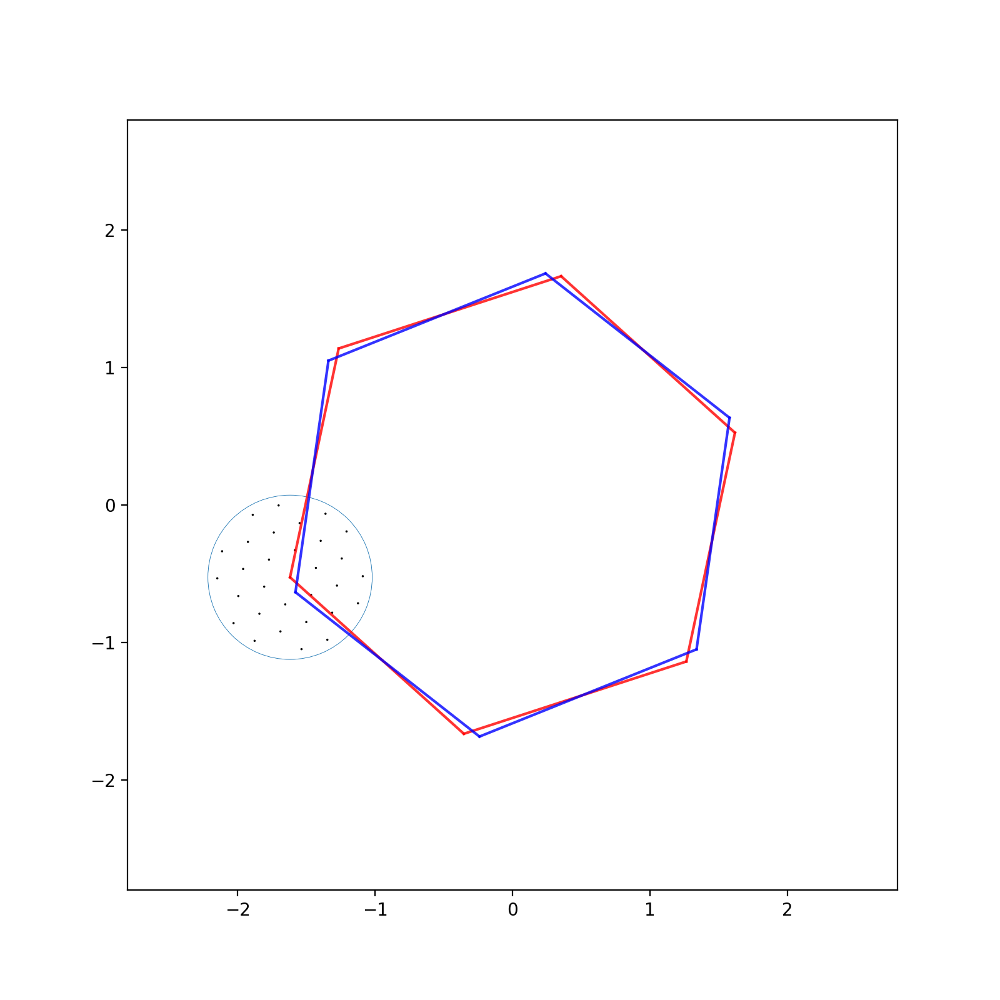

31


In [52]:
plt.close('all')
tmp = TBLG(18. / 180 * np.pi, 3.89 / 180. * np.pi)
tmp.findInteractingK2(tmp.K1, tmp.K1, .6)
tmp.plot2()

In [141]:
plt.close('all')
tblg = TBLGonTMDC(18 / 180 * np.pi, 3.89 / 180. * np.pi)
tblg.initTMDC('WSe2-0.2-0.2-1.94-2.2', onsiteEnergy=1.95)
# tblg.findInteractingK2(tblg.K1, tblg.K1, .6)
tblg.Heff.getVeff(tblg.K1)

array([[ 1.62660808e-02-1.04083409e-17j, -1.32377037e-08-1.12674621e-08j,
         1.92403011e-08+7.11164350e-09j, -7.24253818e-09-2.22371129e-08j],
       [-1.32377037e-08+1.12674621e-08j,  1.62660808e-02-6.93889390e-18j,
         1.69519230e-03+5.52167164e-03j,  1.92403011e-08+7.11164349e-09j],
       [ 1.92403011e-08-7.11164350e-09j,  1.69519230e-03-5.52167164e-03j,
         2.75276898e-02+0.00000000e+00j, -6.38573930e-09-1.51516854e-08j],
       [-7.24253818e-09+2.22371129e-08j,  1.92403011e-08-7.11164350e-09j,
        -6.38573930e-09+1.51516854e-08j,  2.75276898e-02+8.67361738e-19j]])

In [62]:
from numpy import linalg as LA

tblg = TBLG(12. / 180 * np.pi, 3.89 / 180. * np.pi)

plotRadius = 0.0004
vertex1 = tblg.K2 - plotRadius
vertex2 = tblg.K2
vertex3 = tblg.K2 + plotRadius

nPoint = np.array([20, 21], dtype=int) * 4
kPath = []
for k in np.linspace(0, 1, nPoint[0]):
    kPath.append(vertex1 + k * (vertex2 - vertex1))
for k in np.linspace(0, 1, nPoint[1], endpoint=True):
    kPath.append(vertex2 + k * (vertex3 - vertex2))

# kPath = []
# for i in np.linspace(0, 1, nPoint[0]):
#     kPath.append(tblg.K2 + i * (tblg.K1 - tblg.K2))

tblg.findInteractingK(kPath[0], 2.)
energy = np.zeros((np.sum(nPoint), tblg.dim * 8))
spin = np.zeros((np.sum(nPoint), tblg.dim * 8))
count = 0
tmp = np.zeros(tblg.dim * 8)
for i in range(tblg.dim * 2):
    tmp[4 * i + 0] = tmp[4 * i + 1] =  1
    tmp[4 * i + 2] = tmp[4 * i + 3] = -1
for k in kPath:
#     tblg.findInteractingK2(k, (tblg.K1 + tblg.K2) / 2., 0.8)
    tblg.findInteractingK(k, 2.)
    H = tblg.getHamiltonian(k)
    w, v = LA.eigh(H)
    energy[count, :] = np.real(w)
    spin[count, :] = tmp @ (np.abs(v) ** 2)
    count += 1
    
plotData = np.zeros((np.sum(list(map(lambda x: len(x), energy))), 3))
x = 0
count = 0
for i in range(energy.shape[0]):
    for j in range(energy.shape[1]):
        plotData[count, 0] = x
        plotData[count, 1] = energy[i, j]
        plotData[count, 2] = spin[i, j]
        count += 1
    x += 1
    
np.save('tblg-2.npy', plotData)

<IPython.core.display.Javascript object>


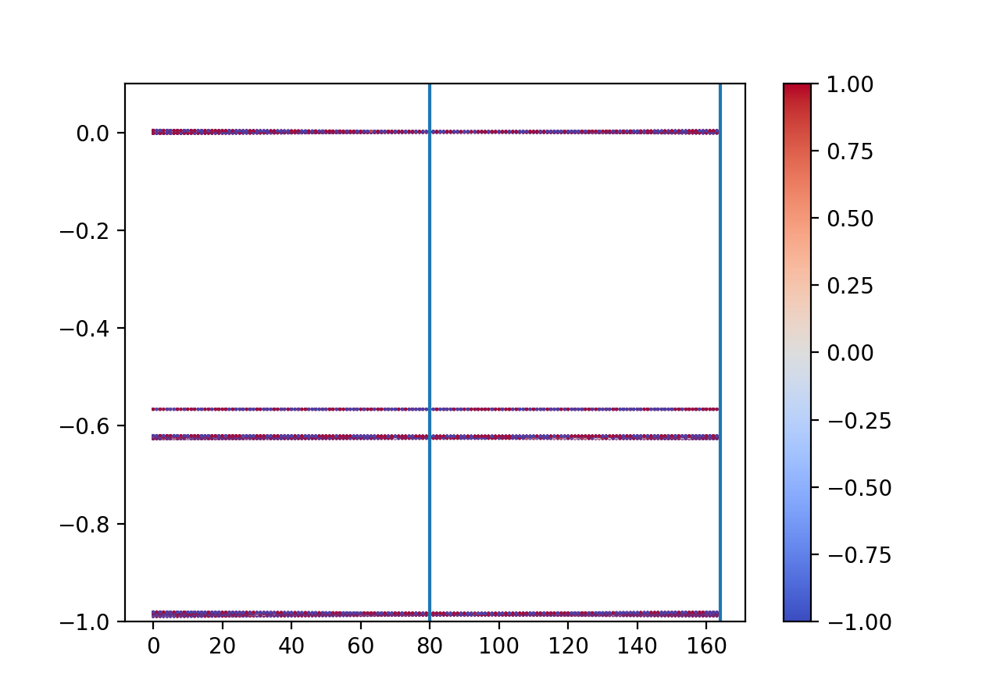

In [9]:
plotData = np.load('tblg-2.npy')
plt.close('all')
scatter = plt.scatter(plotData[:, 0], plotData[:, 1], c=plotData[:, 2],
                      cmap='coolwarm', vmin=-1., vmax=1., s=0.2)
plt.colorbar(scatter)
plt.axvline(x=nPoint[0])
plt.axvline(x=nPoint[0] + nPoint[1])
plt.ylim((-1, .1))
plt.show()

## TBLG 3.89 deg.

In [38]:
from numpy import linalg as LA

tblg = TBLG(12. / 180 * np.pi, 3.89 / 180. * np.pi)

vertex1 = tblg.K1
vertex2 = tblg.K2

nPoint = np.array([256], dtype=int)
kPath = []
for k in np.linspace(0, 1, nPoint[0], endpoint=True):
    kPath.append(vertex1 + k * (vertex2 - vertex1))

# kPath = []
# for i in np.linspace(0, 1, nPoint[0]):
#     kPath.append(tblg.K2 + i * (tblg.K1 - tblg.K2))
    
energy = []
for k in kPath:
#     tblg.findInteractingK2(k, (tblg.K1 + tblg.K2) / 2., 0.8)
    tblg.findInteractingK(tb, 2.)
    H = tblg.getHamiltonian(k)
    tmp, _ = LA.eigh(H)
    energy.append(np.real(tmp))
    
plotData = np.zeros((np.sum(list(map(lambda x: len(x), energy))), 2))
x = 0
count = 0
for i in energy:
    for j in i:
        plotData[count, 0] = x
        plotData[count, 1] = j
        count += 1
    x += 1
    
np.save('tblg-5.npy', plotData)

In [6]:
from numpy import linalg as LA

tblg = TBLG(18. / 180 * np.pi, 3.89 / 180. * np.pi)

vertex1 = tblg.K2
vertex2 = tblg.K1 + 1. / 3. * (tblg.gm1 + tblg.gm2)
vertex3 = vertex2 - 1. / 2. * tblg.gm2
vertex4 = tblg.K1

n0 = 20
n1 = int(np.sqrt(((vertex3 - vertex2)@(vertex3 - vertex2)) / ((vertex2 - vertex1)@(vertex2 - vertex1))) * n0)
n2 = int(np.sqrt(((vertex4 - vertex3)@(vertex4 - vertex3)) / ((vertex2 - vertex1)@(vertex2 - vertex1))) * n0)
nPoint = np.array([n0, n1, n2], dtype=int) * 4
kPath = []
for k in np.linspace(0, 1, nPoint[0]):
    kPath.append(vertex1 + k * (vertex2 - vertex1))
for k in np.linspace(0, 1, nPoint[1]):
    kPath.append(vertex2 + k * (vertex3 - vertex2))
for k in np.linspace(0, 1, nPoint[2], endpoint=True):
    kPath.append(vertex3 + k * (vertex4 - vertex3))

# kPath = []
# for i in np.linspace(0, 1, nPoint[0]):
#     kPath.append(tblg.K2 + i * (tblg.K1 - tblg.K2))
    
center = (tblg.K1 + tblg.K2) / 2.
energy = []
for k in kPath:
    # K
    tblg.findInteractingK2(k, center, 0.4)
#     tblg.findInteractingK2(k, k, 1.2)
    H = tblg.getHamiltonian(k)
    tmp, _ = LA.eigh(H)
    energy.append(np.real(tmp))
    
    # K'
    tblg.findInteractingK2(k, -center, 0.4)
#     tblg.findInteractingK2(k, k, 1.2)
    H = tblg.getHamiltonian(k)
    tmp, _ = LA.eigh(H)
    energy.append(np.real(tmp))
    
plotData = np.zeros((np.sum(list(map(len, energy))), 2))
x = 0
count = 0
for i in energy:
    for j in i:
        plotData[count, 0] = np.floor(x)
        plotData[count, 1] = j
        count += 1
    x += 0.5
    
np.save('tblg-6.npy', plotData)

<IPython.core.display.Javascript object>


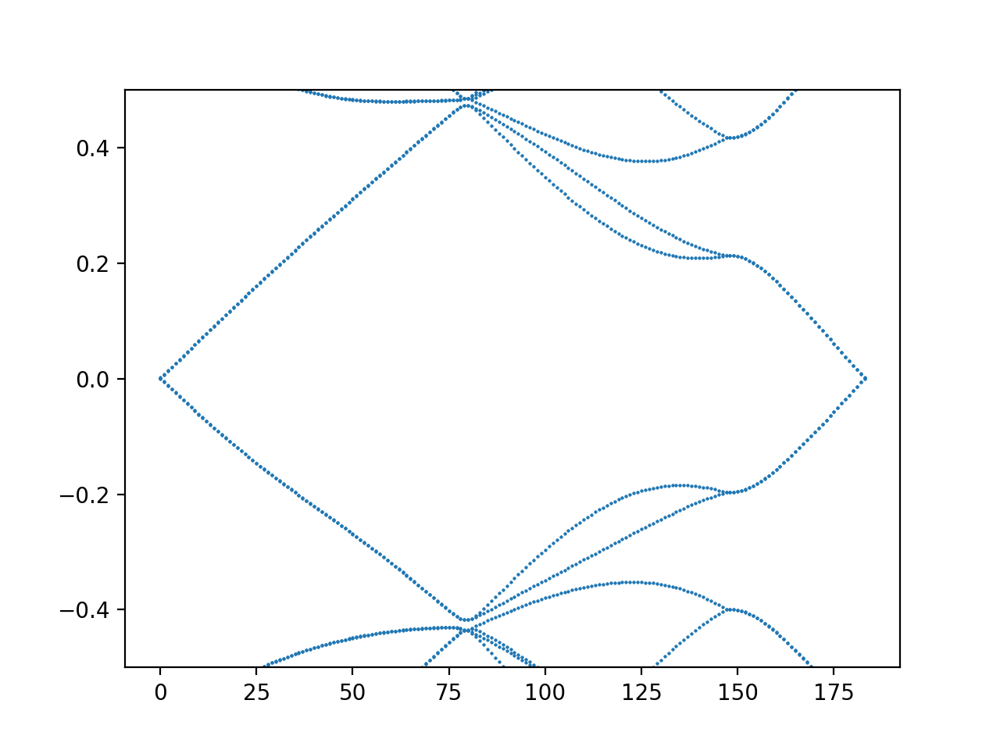

In [241]:
plt.close('all')
plt.scatter(plotData[:, 0], plotData[:, 1], s=0.2)
plt.ylim((-.5, .5))
plt.show()

<IPython.core.display.Javascript object>


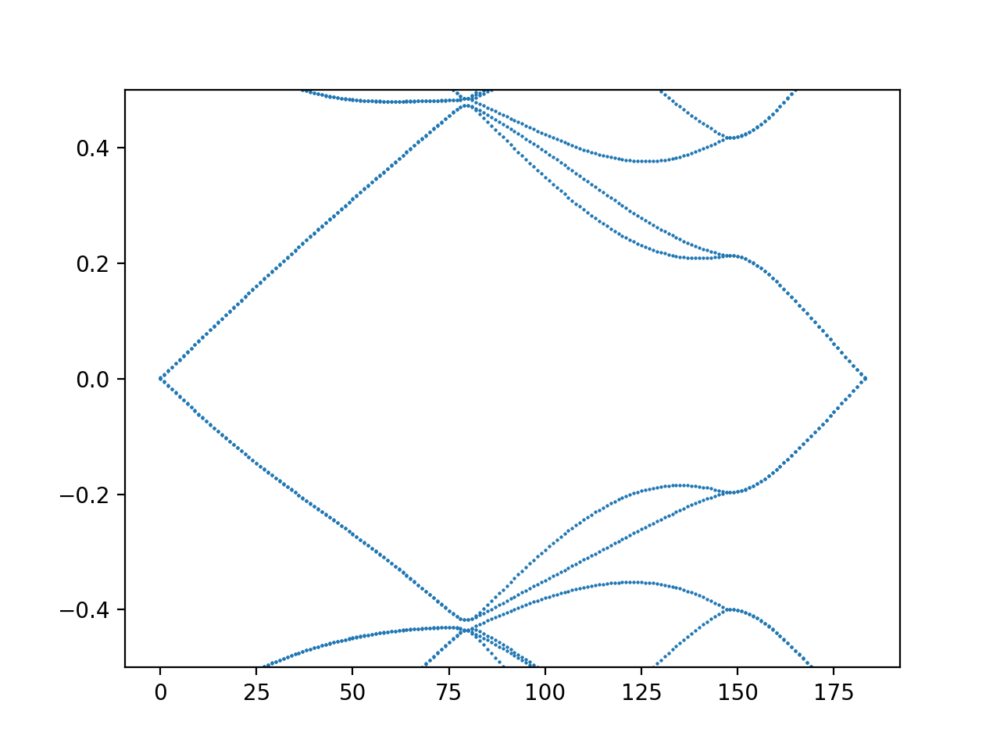

In [7]:
plt.close('all')
plt.scatter(plotData[:, 0], plotData[:, 1], s=0.2)
plt.ylim((-.5, .5))
plt.show()

<IPython.core.display.Javascript object>


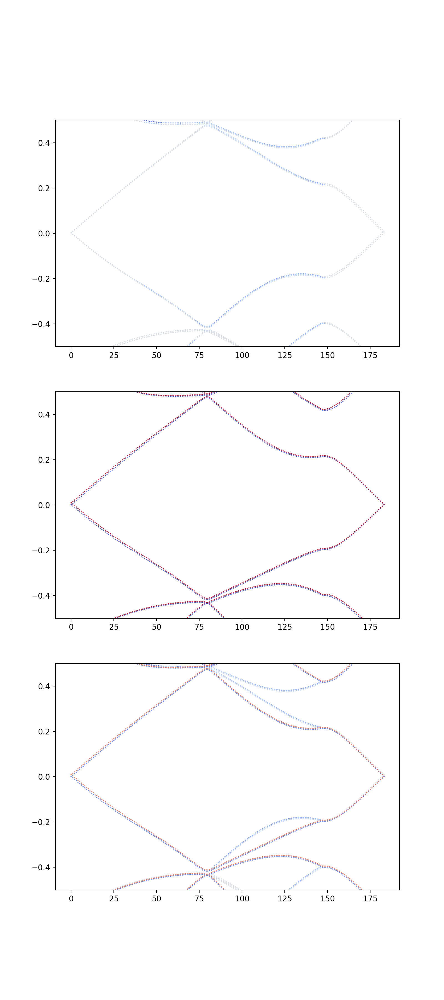

In [40]:
main(18, 3.89, cutoff=0.6, bias=0.)

<IPython.core.display.Javascript object>


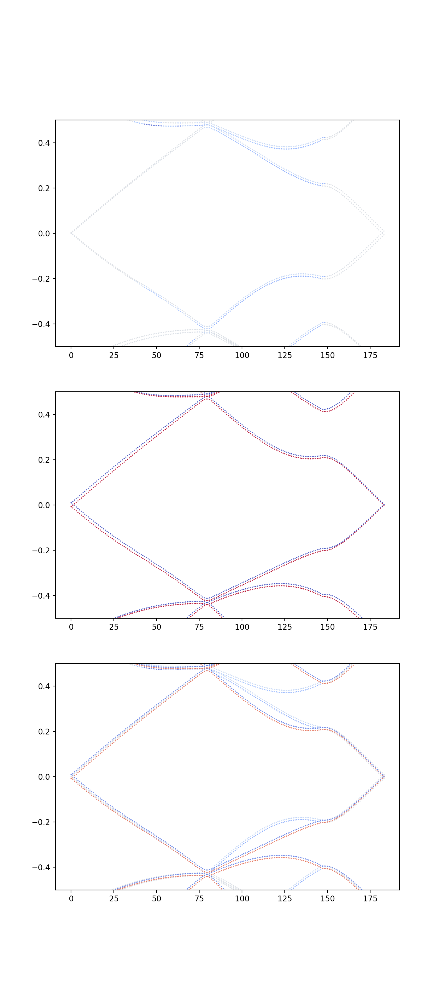

In [311]:
main(18, 3.89, cutoff=0.6, bias=0.)

## TBLG 3.89 deg. @ WSe2 w/o bias

<IPython.core.display.Javascript object>


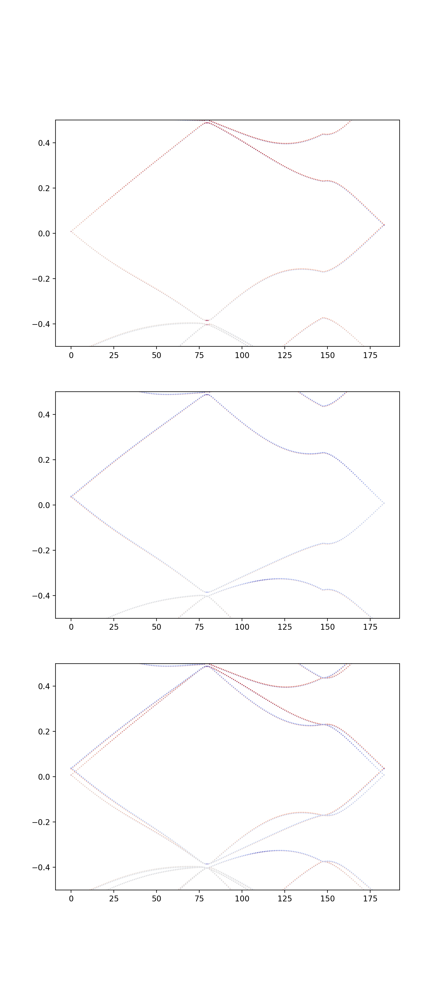

In [45]:
main(18, 3.89, cutoff=0.4, bias=0., n=20)

## TBLG 3.89 deg. @ WSe2 with bias

<IPython.core.display.Javascript object>


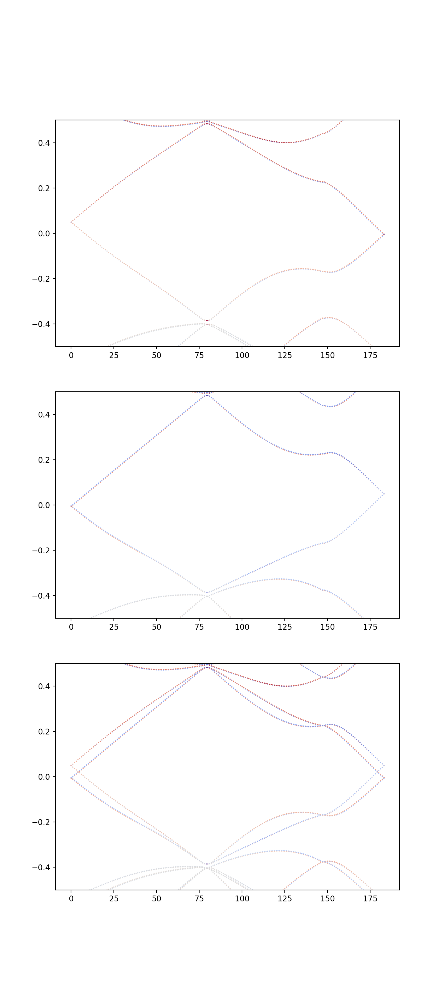

In [177]:
main(18, 3.89, cutoff=0.4, bias=0.06, n=20, mode='load')

<IPython.core.display.Javascript object>


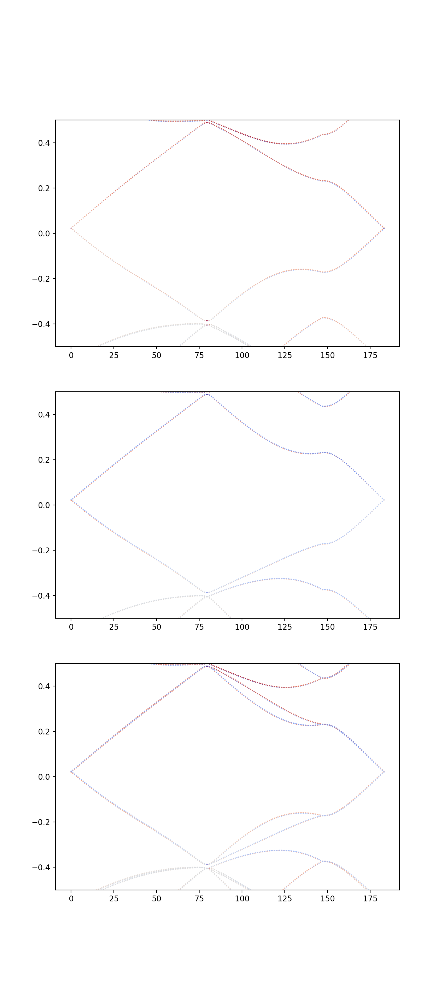

In [178]:
main(18, 3.89, cutoff=0.4, bias=0.021, n=20, mode='load')

## TBLG 1.47 deg.

In [4]:
from numpy import linalg as LA

tblg = TBLG(18. / 180 * np.pi, 1.47 / 180. * np.pi)
cutoff = 0.3

vertex1 = tblg.K2
vertex2 = tblg.K1 + 1. / 3. * (tblg.gm1 + tblg.gm2)
vertex3 = vertex2 - 1. / 2. * tblg.gm2
vertex4 = tblg.K1

n0 = 20
n1 = int(np.sqrt(((vertex3 - vertex2)@(vertex3 - vertex2)) / ((vertex2 - vertex1)@(vertex2 - vertex1))) * n0)
n2 = int(np.sqrt(((vertex4 - vertex3)@(vertex4 - vertex3)) / ((vertex2 - vertex1)@(vertex2 - vertex1))) * n0)
nPoint = np.array([n0, n1, n2], dtype=int) * 4
kPath = []
for k in np.linspace(0, 1, nPoint[0]):
    kPath.append(vertex1 + k * (vertex2 - vertex1))
for k in np.linspace(0, 1, nPoint[1]):
    kPath.append(vertex2 + k * (vertex3 - vertex2))
for k in np.linspace(0, 1, nPoint[2], endpoint=True):
    kPath.append(vertex3 + k * (vertex4 - vertex3))

# kPath = []
# for i in np.linspace(0, 1, nPoint[0]):
#     kPath.append(tblg.K2 + i * (tblg.K1 - tblg.K2))
    
center = (tblg.K1 + tblg.K2) / 2.
energy = []
for k in kPath:
    # K
    tblg.findInteractingK2(k, center, cutoff)
#     tblg.findInteractingK2(k, k, 1.2)
    H = tblg.getHamiltonian(k)
    tmp, _ = LA.eigh(H)
    energy.append(np.real(tmp))
    
    # K'
    tblg.findInteractingK2(k, -center, cutoff)
#     tblg.findInteractingK2(k, k, 1.2)
    H = tblg.getHamiltonian(k)
    tmp, _ = LA.eigh(H)
    energy.append(np.real(tmp))
    
plotData = np.zeros((np.sum(list(map(len, energy))), 2))
x = 0
count = 0
for i in energy:
    for j in i:
        plotData[count, 0] = np.floor(x)
        plotData[count, 1] = j
        count += 1
    x += 0.5
    
np.save('tblg-1.47.npy', plotData)

<IPython.core.display.Javascript object>


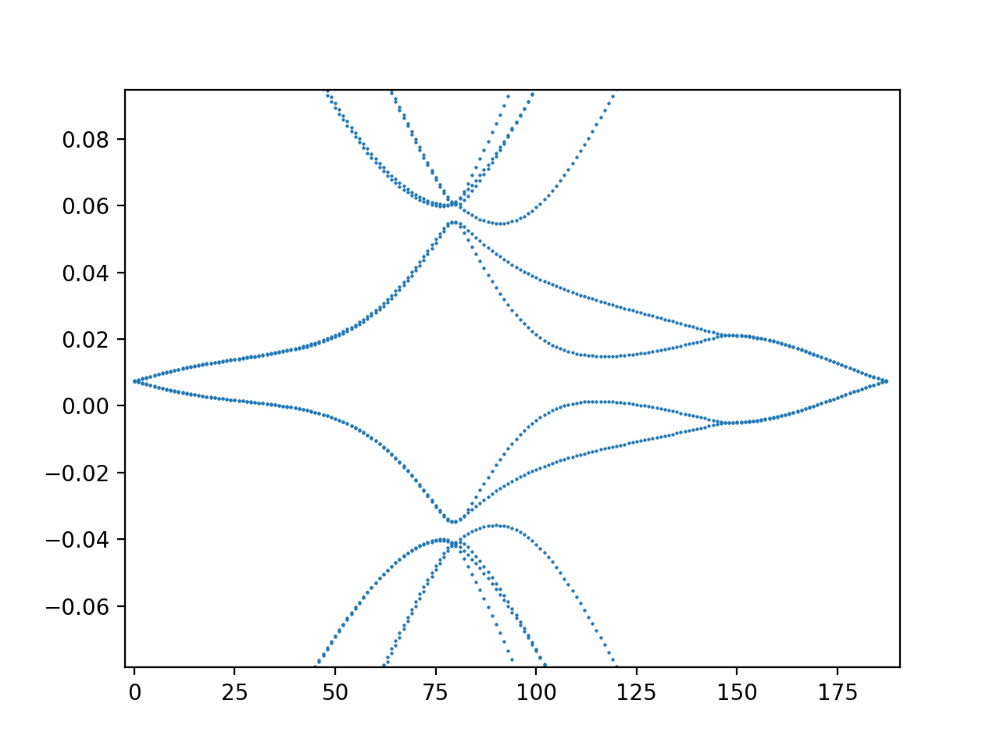

In [5]:
plt.close('all')
plt.scatter(plotData[:, 0], plotData[:, 1], s=0.2)
plt.ylim((-.5, .5))
plt.show()

## TBLG 1.47 deg. @ WSe2 w/o bias

In [92]:
from numpy import linalg as LA

tblg = TBLGonTMDC(18. / 180 * np.pi, 1.47 / 180. * np.pi)
tblg.initTMDC('WSe2-0.2-0.2-1.94-2.2', onsiteEnergy=0.1)
cutoff = 0.4

vertex1 = tblg.K2
vertex2 = tblg.K1 + 1. / 3. * (tblg.gm1 + tblg.gm2)
vertex3 = vertex2 - 1. / 2. * tblg.gm2
vertex4 = tblg.K1

n0 = 20
n1 = int(np.sqrt(((vertex3 - vertex2)@(vertex3 - vertex2)) / ((vertex2 - vertex1)@(vertex2 - vertex1))) * n0)
n2 = int(np.sqrt(((vertex4 - vertex3)@(vertex4 - vertex3)) / ((vertex2 - vertex1)@(vertex2 - vertex1))) * n0)
nPoint = np.array([n0, n1, n2], dtype=int) * 4
kPath = []
for k in np.linspace(0, 1, nPoint[0]):
    kPath.append(vertex1 + k * (vertex2 - vertex1))
for k in np.linspace(0, 1, nPoint[1]):
    kPath.append(vertex2 + k * (vertex3 - vertex2))
for k in np.linspace(0, 1, nPoint[2], endpoint=True):
    kPath.append(vertex3 + k * (vertex4 - vertex3))

# kPath = []
# for i in np.linspace(0, 1, nPoint[0]):
#     kPath.append(tblg.K2 + i * (tblg.K1 - tblg.K2))
    
center = (tblg.K1 + tblg.K2) / 2.
energy = []
for k in kPath:
    # K
    tblg.findInteractingK2(k, center, cutoff)
#     tblg.findInteractingK2(k, k, 1.2)
    H = tblg.getHamiltonian(k)
    tmp, _ = LA.eigh(H)
    energy.append(np.real(tmp))
    
    # K'
    tblg.findInteractingK2(k, -center, cutoff)
#     tblg.findInteractingK2(k, k, 1.2)
    H = tblg.getHamiltonian(k)
    tmp, _ = LA.eigh(H)
    energy.append(np.real(tmp))
    
plotData = np.zeros((np.sum(list(map(len, energy))), 2))
x = 0
count = 0
for i in energy:
    for j in i:
        plotData[count, 0] = np.floor(x)
        plotData[count, 1] = j
        count += 1
    x += 0.5
    
np.save('tblg1.47-WSe2.npy', plotData)

<IPython.core.display.Javascript object>


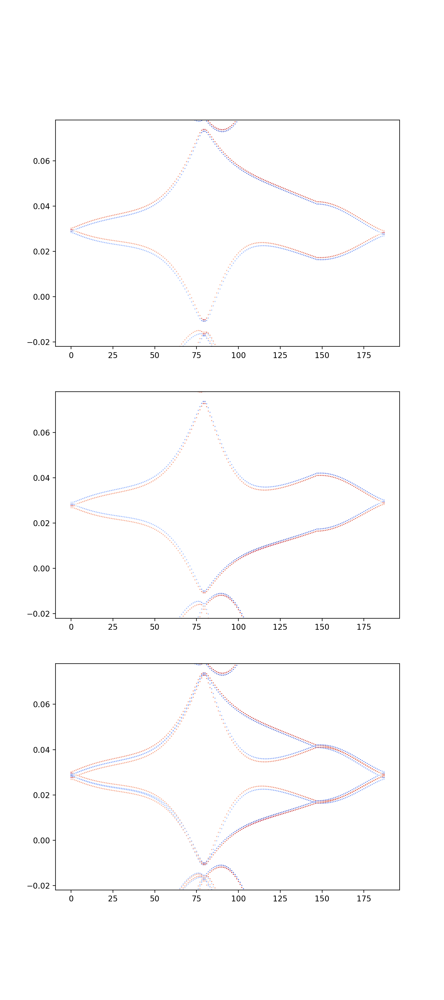

In [75]:
main(18, 1.47, cutoff=0.3, bias=0., n=20, mode='load', eCenter=0.028, eRange=0.05)

## TBLG 1.47 deg. @ WSe2 with bias

<IPython.core.display.Javascript object>


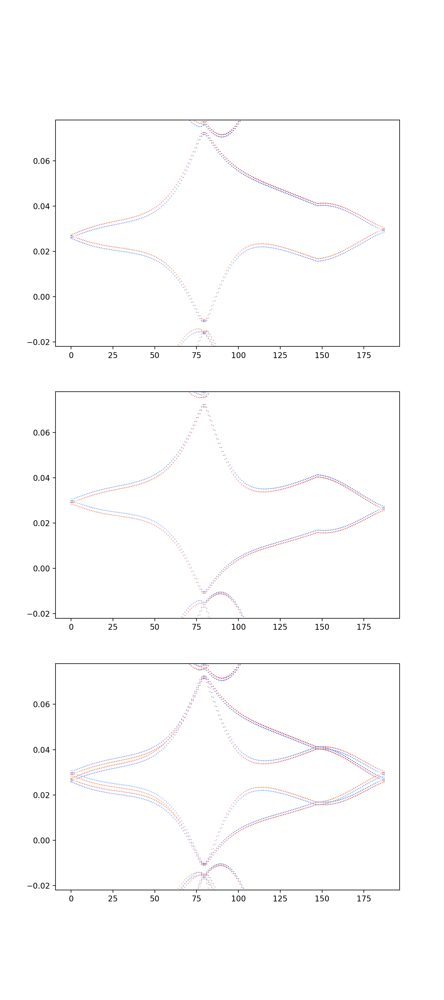

In [76]:
main(18, 1.47, cutoff=0.3, bias=0.06, n=20, mode='load', eCenter=0.028, eRange=0.05)

<IPython.core.display.Javascript object>


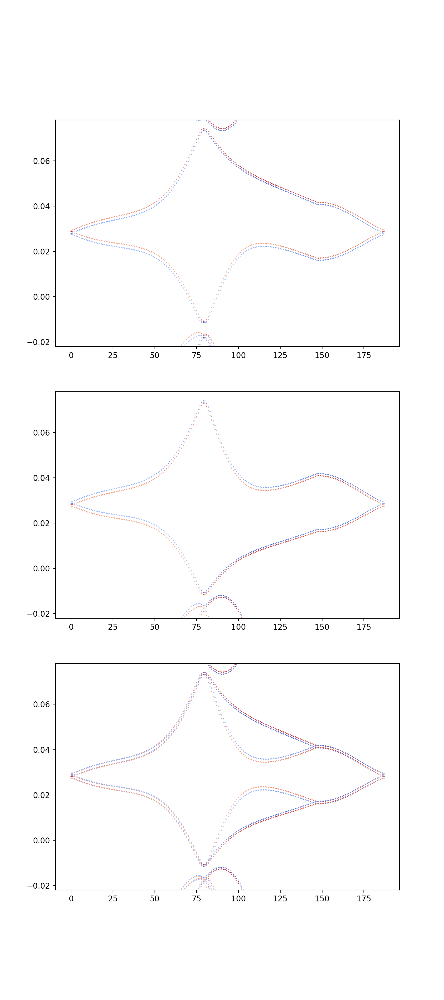

In [160]:
main(18, 1.47, cutoff=0.3, bias=0.02, n=20, eCenter=0.028, eRange=0.05)

## TBLG 1.05 deg.

In [96]:
from numpy import linalg as LA

tblg = TBLG(18. / 180 * np.pi, 1.05012 / 180. * np.pi)
cutoff = 0.20

vertex1 = tblg.K2
vertex2 = tblg.K1 + 1. / 3. * (tblg.gm1 + tblg.gm2)
vertex3 = vertex2 - 1. / 2. * tblg.gm2
vertex4 = tblg.K1

n0 = 20
n1 = int(np.sqrt(((vertex3 - vertex2)@(vertex3 - vertex2)) / ((vertex2 - vertex1)@(vertex2 - vertex1))) * n0)
n2 = int(np.sqrt(((vertex4 - vertex3)@(vertex4 - vertex3)) / ((vertex2 - vertex1)@(vertex2 - vertex1))) * n0)
nPoint = np.array([n0, n1, n2], dtype=int) * 4
kPath = []
for k in np.linspace(0, 1, nPoint[0]):
    kPath.append(vertex1 + k * (vertex2 - vertex1))
for k in np.linspace(0, 1, nPoint[1]):
    kPath.append(vertex2 + k * (vertex3 - vertex2))
for k in np.linspace(0, 1, nPoint[2], endpoint=True):
    kPath.append(vertex3 + k * (vertex4 - vertex3))

# kPath = []
# for i in np.linspace(0, 1, nPoint[0]):
#     kPath.append(tblg.K2 + i * (tblg.K1 - tblg.K2))
    
center = (tblg.K1 + tblg.K2) / 2.
energy = []
for k in kPath:
    # K
    tblg.findInteractingK2(k, center, cutoff)
#     tblg.findInteractingK2(k, k, 1.2)
    H = tblg.getHamiltonian(k)
    tmp, _ = LA.eigh(H)
    energy.append(np.real(tmp))
    
    # K'
    tblg.findInteractingK2(k, -center, cutoff)
#     tblg.findInteractingK2(k, k, 1.2)
    H = tblg.getHamiltonian(k)
    tmp, _ = LA.eigh(H)
    energy.append(np.real(tmp))
    
plotData = np.zeros((np.sum(list(map(len, energy))), 2))
x = 0
count = 0
for i in energy:
    for j in i:
        plotData[count, 0] = np.floor(x)
        plotData[count, 1] = j
        count += 1
    x += 0.5
    
np.save('tblg-1.npy', plotData)

<IPython.core.display.Javascript object>


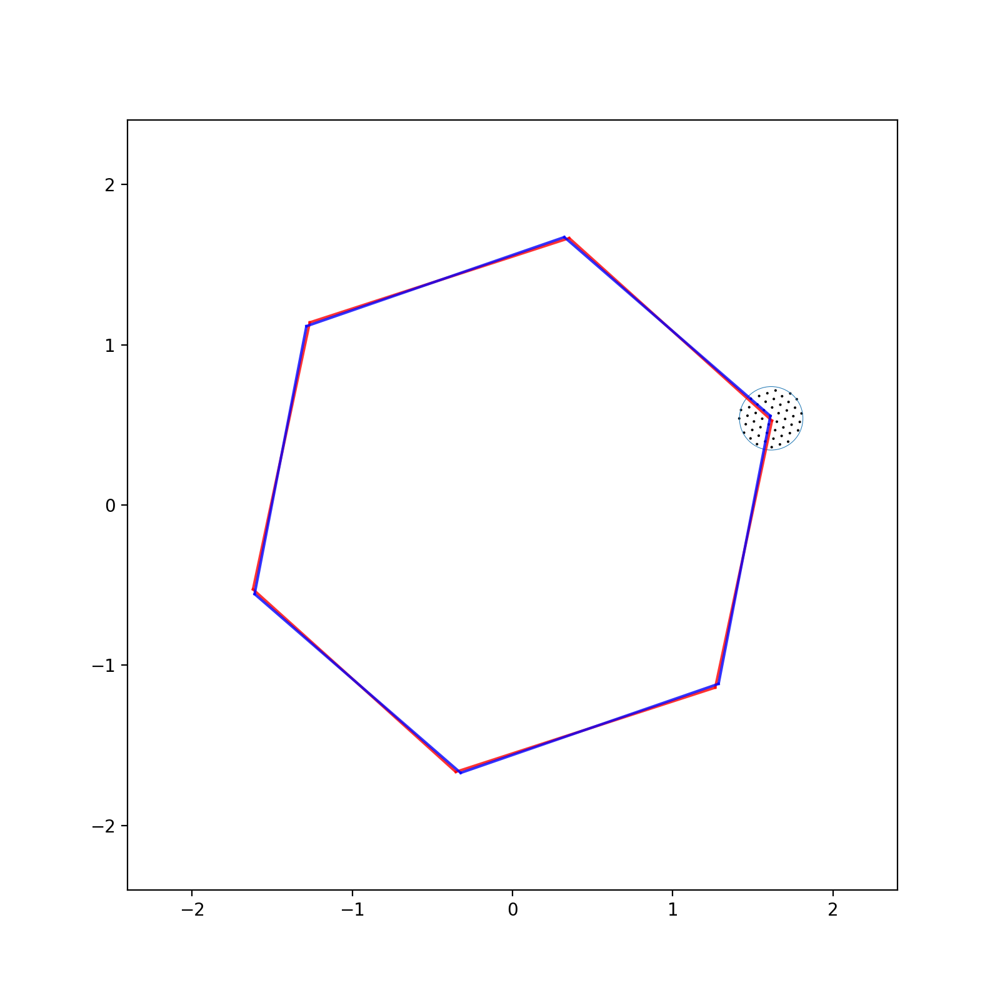

50


In [146]:
tblg = TBLG(18. / 180 * np.pi, 1.05012 / 180. * np.pi)
center = (tblg.K1 + tblg.K2) / 2.
tblg.findInteractingK2(tblg.K1, -center, 0.2)
tblg.plot2()

In [102]:
tblg = TBLGonTMDC(18. / 180 * np.pi, 1.05012 / 180. * np.pi)
tblg.initTMDC('WSe2-0.2-0.2-1.94-2.2', onsiteEnergy=0.1)
center = (tblg.K1 + tblg.K2) / 2.
tblg.findInteractingK2(tblg.K1, -center, 0.16)
tblg.Heff.getVeff(tblg.K1)

array([[ 4.29717457e-02+5.42101086e-19j, -7.62487827e-09-1.55972544e-08j,
         7.02419593e-10-7.44815857e-10j, -1.42246573e-09+3.50451911e-10j],
       [-7.62487826e-09+1.55972544e-08j,  4.29717457e-02-7.58941521e-19j,
         8.26299317e-04+2.88985330e-03j,  7.02419593e-10-7.44815857e-10j],
       [ 7.02419594e-10+7.44815857e-10j,  8.26299317e-04-2.88985330e-03j,
         4.12213292e-02-9.75781955e-19j, -7.01931652e-09-1.42608286e-08j],
       [-1.42246573e-09-3.50451911e-10j,  7.02419594e-10+7.44815857e-10j,
        -7.01931652e-09+1.42608286e-08j,  4.12213292e-02+5.42101086e-19j]])

<IPython.core.display.Javascript object>


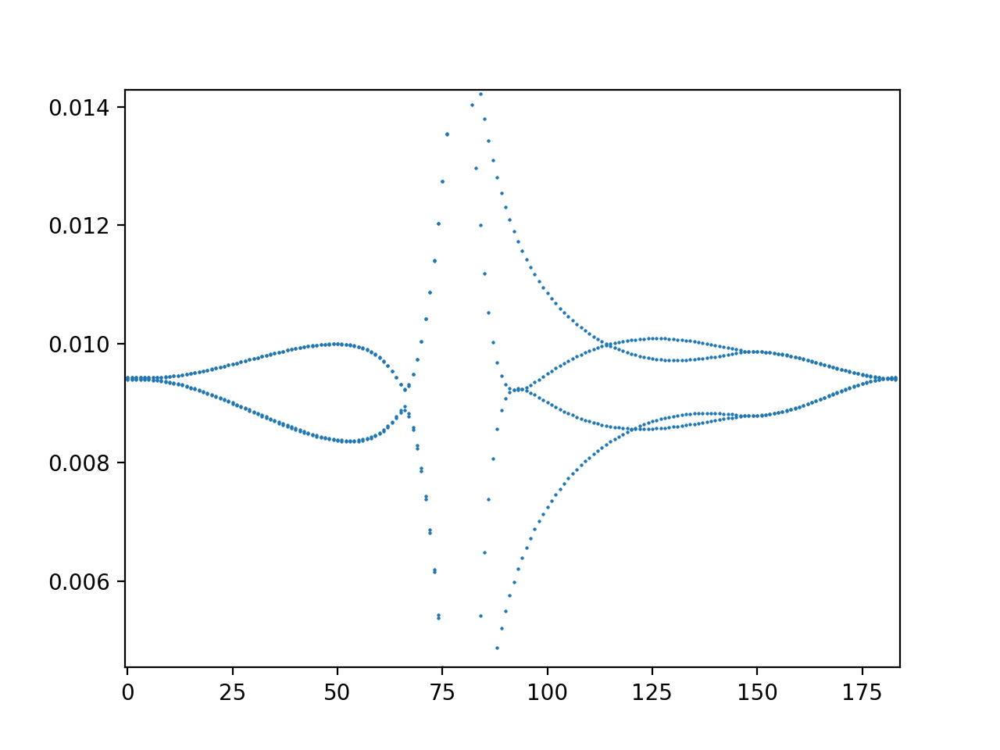

In [97]:
plt.close('all')
plt.scatter(plotData[:, 0], plotData[:, 1], s=0.2)
plt.ylim((-.2, .2))
plt.show()

## TBLG 1.05 deg. @ WSe2 w/o bias

<IPython.core.display.Javascript object>


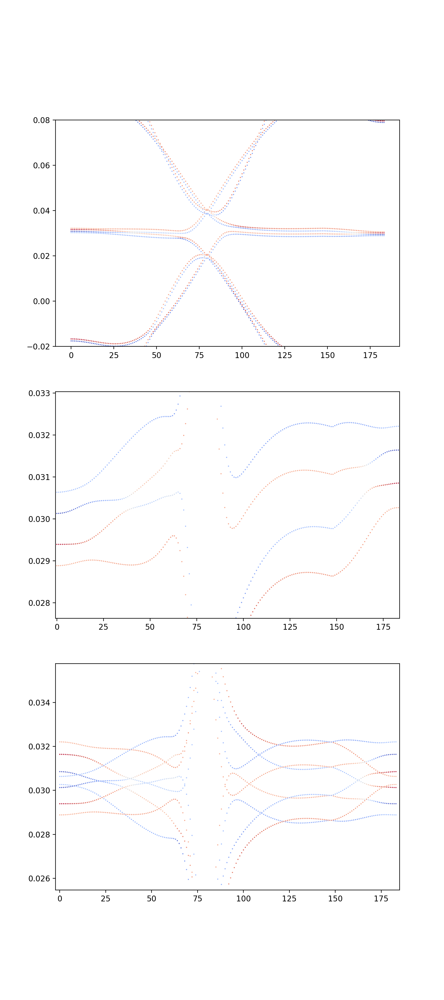

In [104]:
main(18, 1.05012, cutoff=0.2, bias=0., n=20, mode='load', eCenter=0.03, eRange=0.05)

## TBLG 1.05 deg. @ WSe2 with bias

<IPython.core.display.Javascript object>


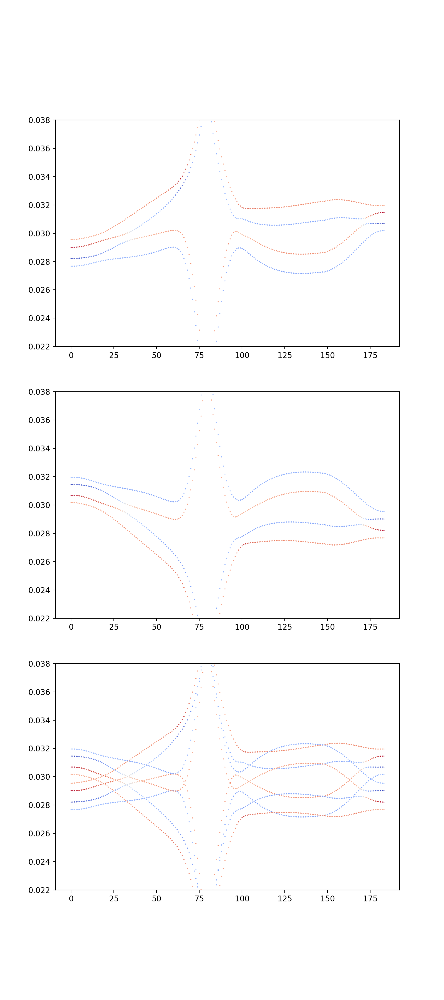

In [106]:
main(18, 1.05012, cutoff=0.2, bias=0.06, n=20, mode='load', eCenter=0.03, eRange=0.008)

<IPython.core.display.Javascript object>


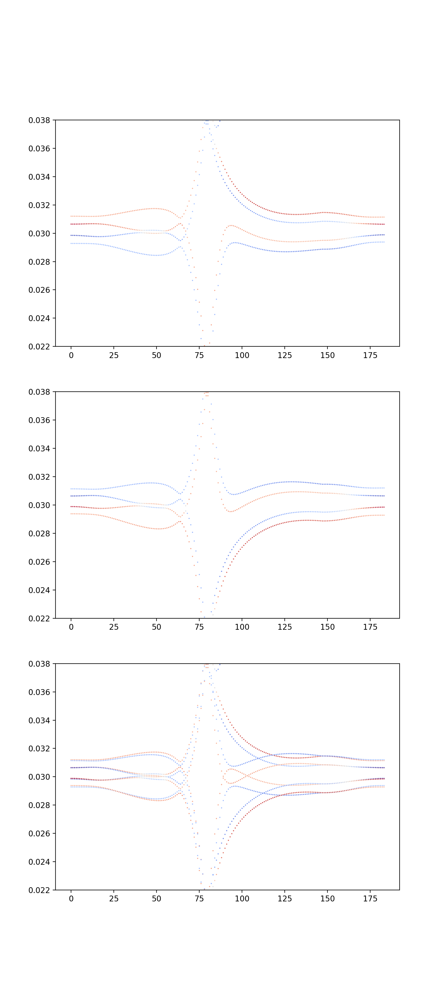

In [164]:
main(18, 1.05012, cutoff=0.2, bias=0.022, n=20, eCenter=0.03, eRange=0.008)

<IPython.core.display.Javascript object>


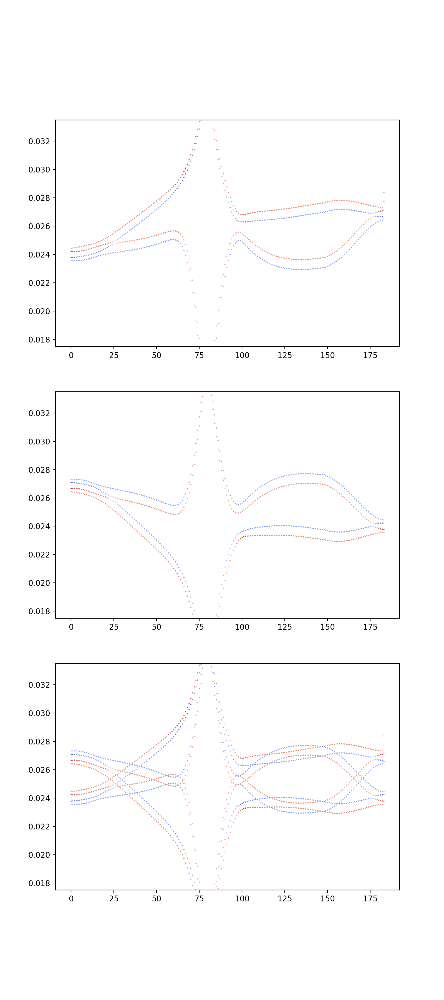

In [108]:
main(0, 1.05012, cutoff=0.2, bias=0.06, n=20, mode='load', eCenter=0.0255, eRange=0.008)

<IPython.core.display.Javascript object>


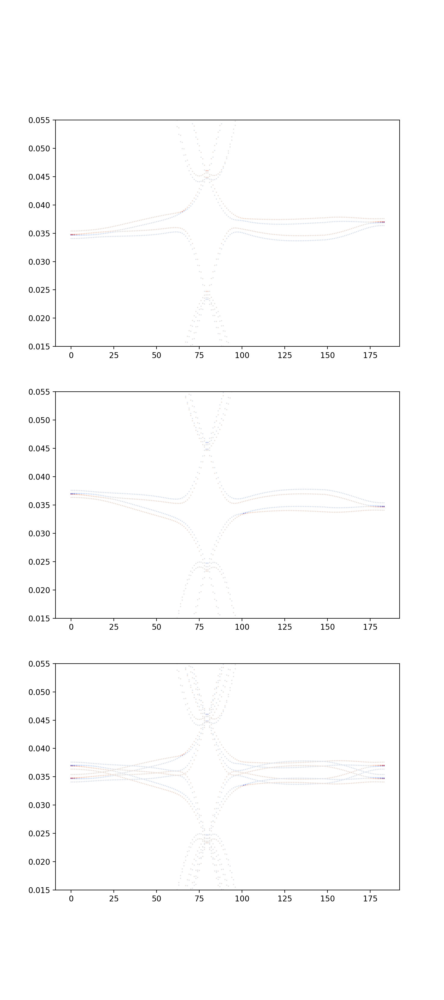

In [113]:
main(30, 1.05012, cutoff=0.2, bias=0.06, n=20, mode='load', eCenter=0.035, eRange=0.02)

## 0.52

<IPython.core.display.Javascript object>


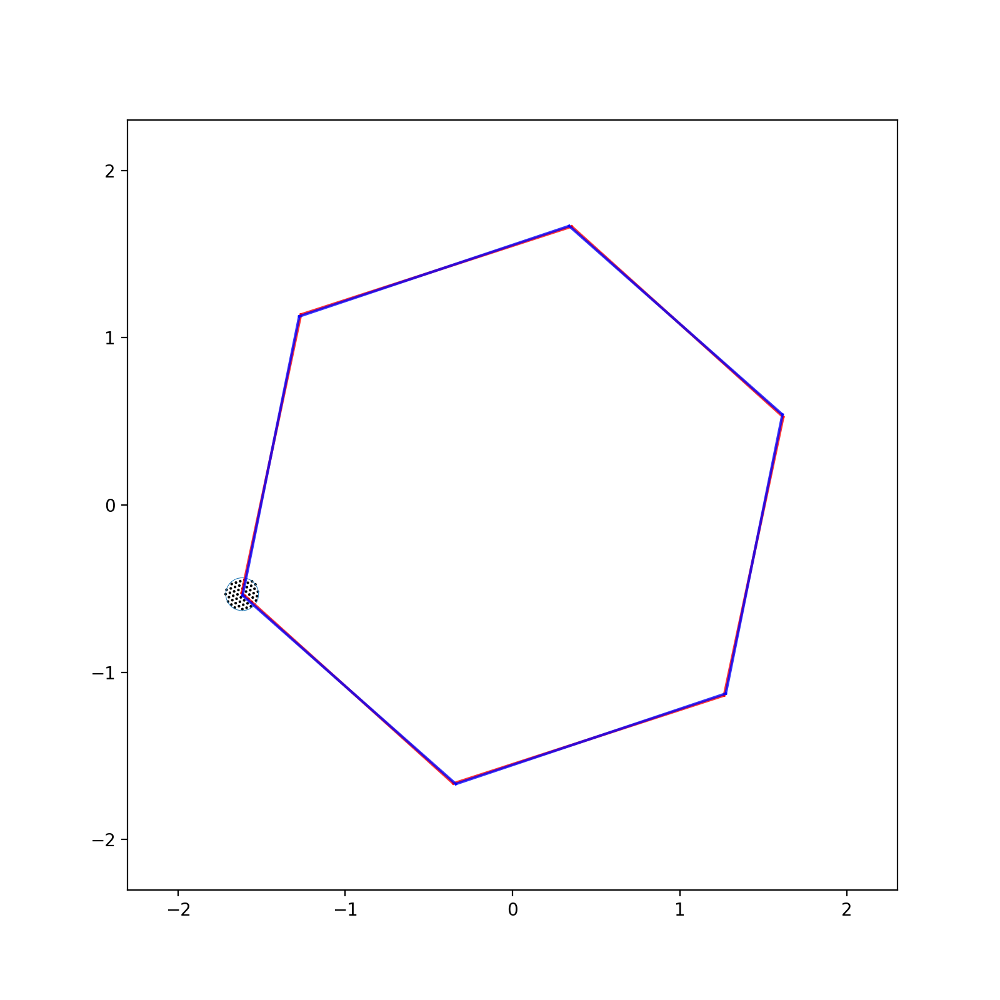

50


In [148]:
tblg = TBLG(18. / 180 * np.pi, 0.5209371 / 180. * np.pi)
center = (tblg.K1 + tblg.K2) / 2.
tblg.findInteractingK2(tblg.K1, center, 0.1)
tblg.plot2()

In [151]:
from numpy import linalg as LA

tblg = TBLG(18. / 180 * np.pi, 0.5209371 / 180. * np.pi)
cutoff = 0.12

vertex1 = tblg.K2
vertex2 = tblg.K1 + 1. / 3. * (tblg.gm1 + tblg.gm2)
vertex3 = vertex2 - 1. / 2. * tblg.gm2
vertex4 = tblg.K1

n0 = 20
n1 = int(np.sqrt(((vertex3 - vertex2)@(vertex3 - vertex2)) / ((vertex2 - vertex1)@(vertex2 - vertex1))) * n0)
n2 = int(np.sqrt(((vertex4 - vertex3)@(vertex4 - vertex3)) / ((vertex2 - vertex1)@(vertex2 - vertex1))) * n0)
nPoint = np.array([n0, n1, n2], dtype=int) * 4
kPath = []
for k in np.linspace(0, 1, nPoint[0]):
    kPath.append(vertex1 + k * (vertex2 - vertex1))
for k in np.linspace(0, 1, nPoint[1]):
    kPath.append(vertex2 + k * (vertex3 - vertex2))
for k in np.linspace(0, 1, nPoint[2], endpoint=True):
    kPath.append(vertex3 + k * (vertex4 - vertex3))

# kPath = []
# for i in np.linspace(0, 1, nPoint[0]):
#     kPath.append(tblg.K2 + i * (tblg.K1 - tblg.K2))
    
center = (tblg.K1 + tblg.K2) / 2.
energy = []
for k in kPath:
    # K
    tblg.findInteractingK2(k, center, cutoff)
#     tblg.findInteractingK2(k, k, 1.2)
    H = tblg.getHamiltonian(k)
    tmp, _ = LA.eigh(H)
    energy.append(np.real(tmp))
    
    # K'
    tblg.findInteractingK2(k, -center, cutoff)
#     tblg.findInteractingK2(k, k, 1.2)
    H = tblg.getHamiltonian(k)
    tmp, _ = LA.eigh(H)
    energy.append(np.real(tmp))
    
plotData = np.zeros((np.sum(list(map(len, energy))), 2))
x = 0
count = 0
for i in energy:
    for j in i:
        plotData[count, 0] = np.floor(x)
        plotData[count, 1] = j
        count += 1
    x += 0.5
    
np.save('tblg-0.5.npy', plotData)

<IPython.core.display.Javascript object>


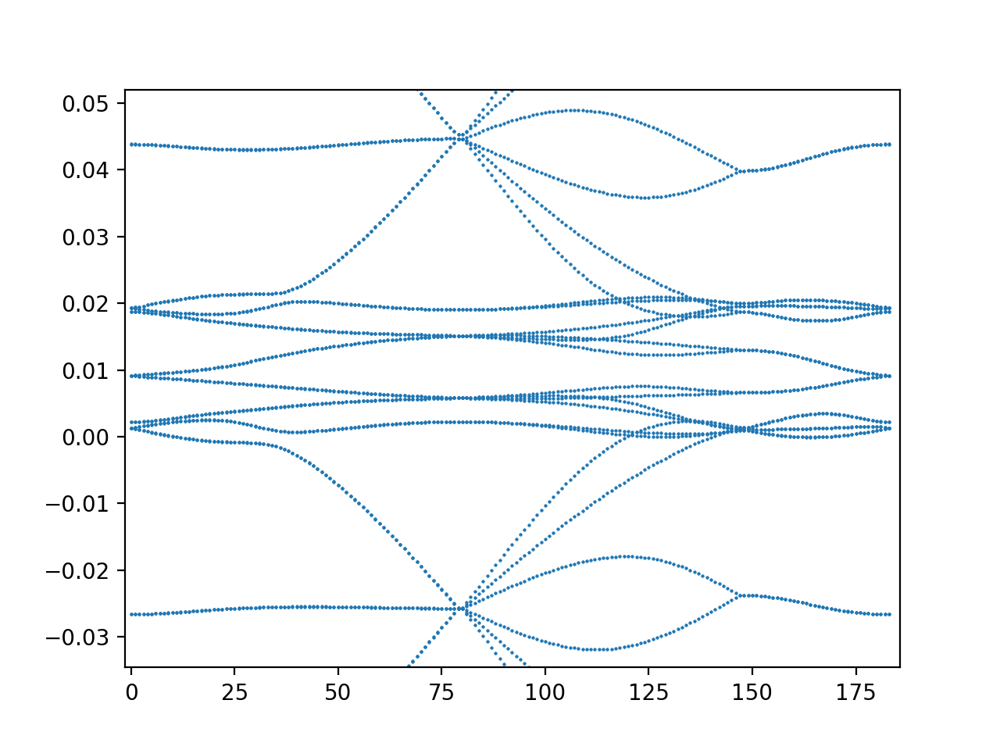

In [152]:
plt.close('all')
plt.scatter(plotData[:, 0], plotData[:, 1], s=0.2)
plt.ylim((-.2, .2))
plt.show()

<IPython.core.display.Javascript object>


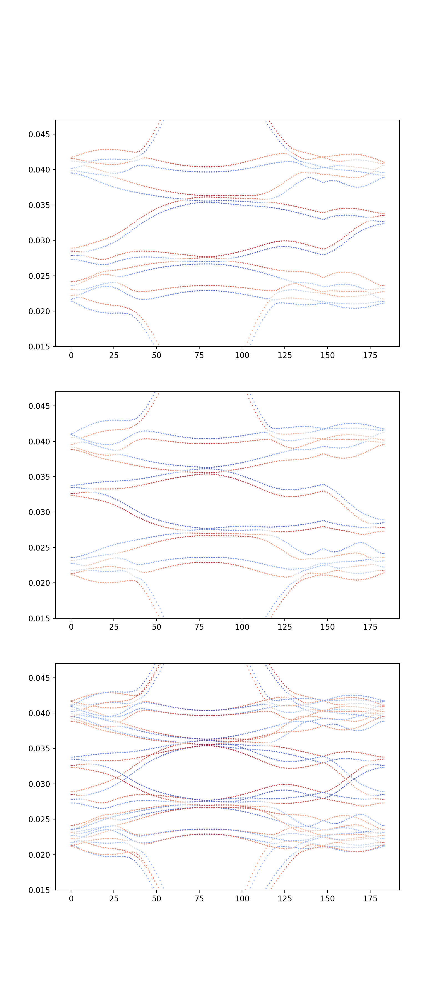

In [156]:
main(18, 0.5209371, cutoff=0.12, bias=0., n=20, mode='load', eCenter=0.031, eRange=0.016)

<IPython.core.display.Javascript object>


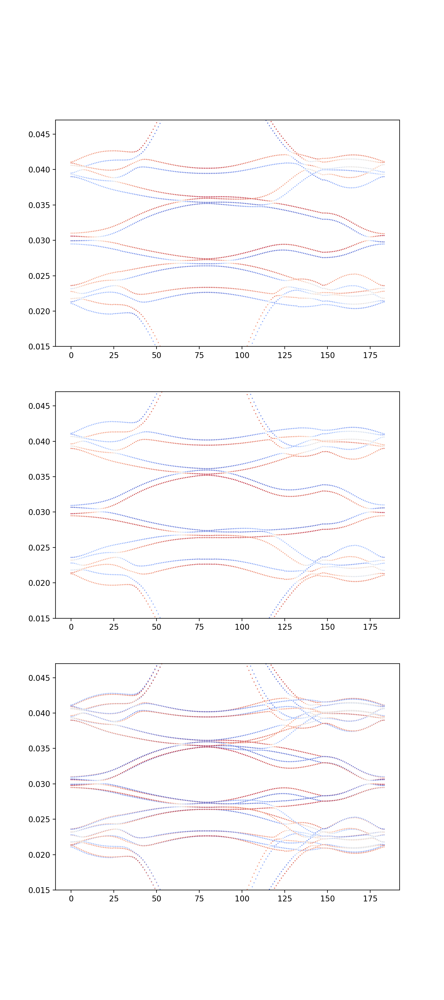

In [180]:
main(18, 0.5209371, cutoff=0.12, bias=0.021, n=20, mode='load', eCenter=0.031, eRange=0.016)